In [1]:
from PIL import Image
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from keras.preprocessing.image import load_img,img_to_array
from keras.applications import vgg16, vgg19
from keras.models import Model
from keras.applications.imagenet_utils import preprocess_input

In [2]:
imgs_path = "datathon/"
img_width, img_height = 224, 224
files = [imgs_path + x for x in os.listdir(imgs_path) if x.endswith((".jpg", ".png"))]
print("Total number of images in dataset:",len(files))

Total number of images in dataset: 981


In [3]:
# load the model
vgg_model = vgg19.VGG19(weights='imagenet')

# remove the last layers in order to get features instead of predictions
feat_extractor = Model(inputs=vgg_model.input, outputs=vgg_model.get_layer("fc2").output)

# print the layers of the CNN
feat_extractor.summary()

2023-12-15 01:14:09.187560: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M1 Pro
2023-12-15 01:14:09.187586: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2023-12-15 01:14:09.187592: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.33 GB
2023-12-15 01:14:09.187625: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-12-15 01:14:09.187644: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [4]:
def preprocess(files):
    importedImages = []
    for f in files:
        filename = f
        original = load_img(filename, target_size=(img_width, img_height))
        numpy_image = img_to_array(original)
        image_batch = np.expand_dims(numpy_image, axis=0)
        importedImages.append(image_batch)
    images = np.vstack(importedImages)
    processed_imgs = preprocess_input(images.copy())
    return processed_imgs
processed_imgs = preprocess(files)
products_features = feat_extractor.predict(processed_imgs)
products = pd.DataFrame(products_features, index = files)
products_features.shape

 1/31 [..............................] - ETA: 6s

2023-12-15 01:14:13.594122: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


31/31 [==============================] - 10s 336ms/step


(981, 4096)

# COSINE SIMILARITY

In [5]:
from sklearn.metrics.pairwise import cosine_similarity

cosSimilarities = cosine_similarity(products)
cos_similarities_df = pd.DataFrame(cosSimilarities, index = files, columns = files)
cos_similarities_df.head(10)
def getID(product_path):
    index = product_path.rfind('_')
    index = product_path.rfind('_', 0, index)
    return product_path[:index]
cos_similarities_df
cos_similarities_df.to_csv('cosSimilarities/VGG19.csv')

In [6]:
def retrieve_most_similar_products(given_img, cos_similarities_df, nb_closest_images):
    print("-----------------------------------------------------------------------")
    product_name = getID(given_img)
    print("original product:", product_name)
    
    original = load_img(given_img, target_size=(img_width, img_height))
    plt.imshow(original)
    plt.show()
    print("-----------------------------------------------------------------------")
    print("most similar products:")
    closest_imgs = cos_similarities_df[given_img].sort_values(ascending=False)[1:nb_closest_images+100].index
    closest_imgs_scores = cos_similarities_df[given_img].sort_values(ascending=False)[1:nb_closest_images+100]
    showed_products = []
    showed_products.append(product_name)
    i = 0
    while(len(showed_products) != nb_closest_images + 1):
        name = getID(closest_imgs[i])
        if name in showed_products:
            i+=1
            continue
        if os.path.exists(name + "_image_1.jpg"):
            filename = name + "_image_1.jpg"
        elif os.path.exists(name + "_image_1.png"):
            filename = name + "_image_1.png"
        else:
            filename = closest_imgs[i]
        original = load_img(filename, target_size=(img_width, img_height))
        plt.imshow(original)
        plt.show()
        print("name: ", name)
        print("similarity score : ",closest_imgs_scores.iloc[i])
        i+=1
        showed_products.append(name)

-----------------------------------------------------------------------
original product: datathon/test


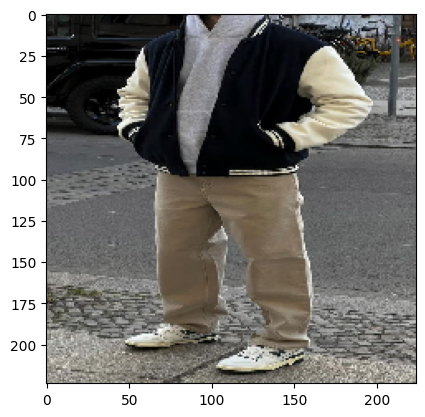

-----------------------------------------------------------------------
most similar products:


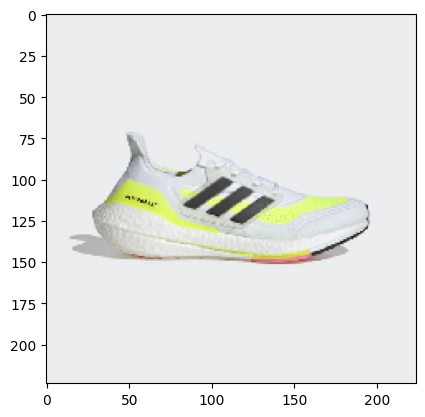

name:  datathon/ultraboost_21_shoes
similarity score :  0.9445087


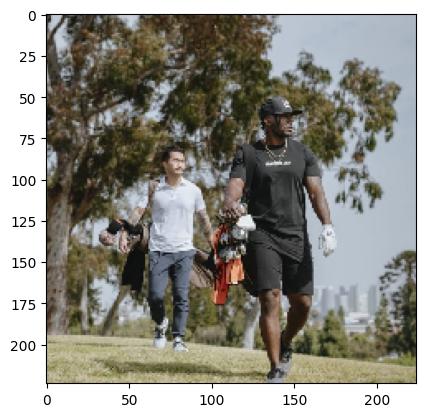

name:  datathon/adicross_hybrid_shorts
similarity score :  0.9101982


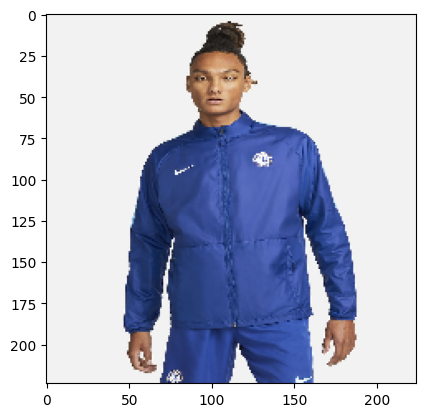

name:  datathon/chelsea_fc_repel_academy_awf
similarity score :  0.88455635


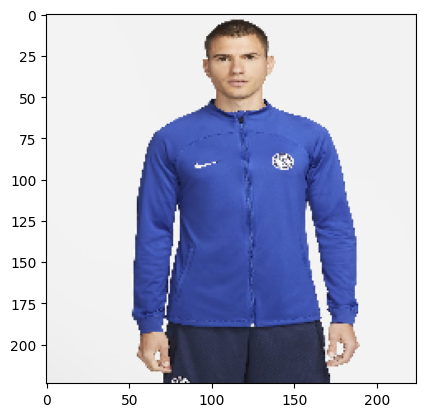

name:  datathon/chelsea_fc_strike
similarity score :  0.8802072


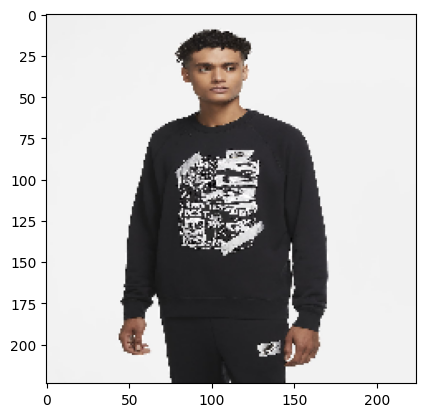

name:  datathon/nike_sportswear
similarity score :  0.87771785


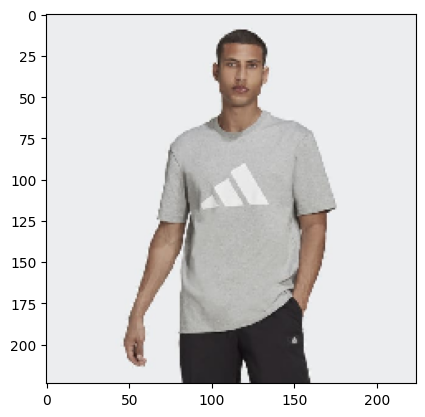

name:  datathon/adidas_sportswear_future_icons_logo_graphic_tee
similarity score :  0.875717


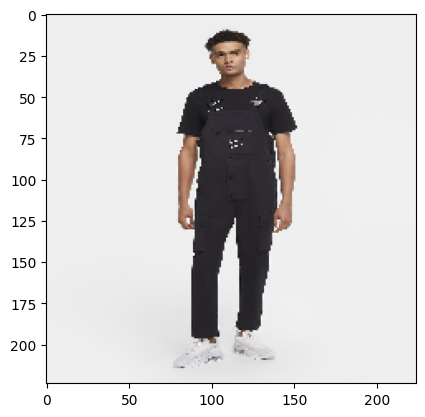

name:  datathon/nike_sportswear_swoosh
similarity score :  0.87528175


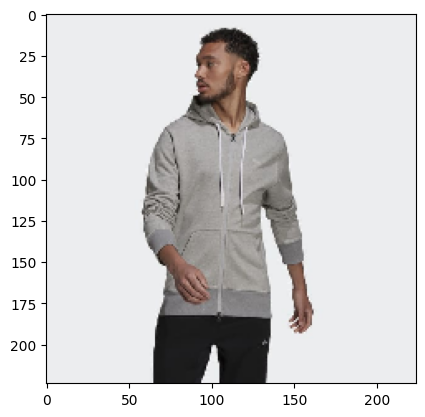

name:  datathon/adidas_sportswear_comfy_&_chill_full_zip_hoodie
similarity score :  0.8737592


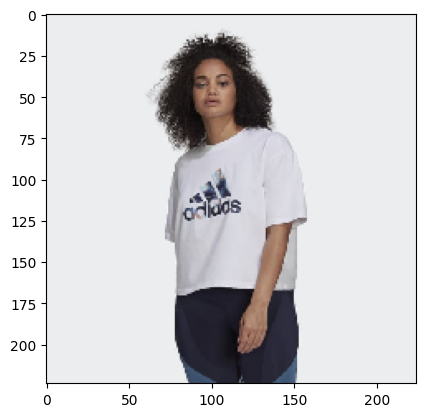

name:  datathon/adidas_x_zoe_saldana_crop_logo_tee_(plus_size)
similarity score :  0.86883456


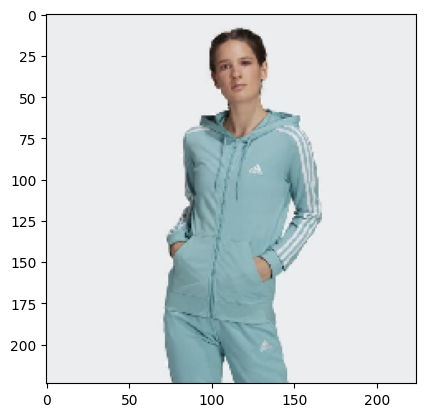

name:  datathon/essentials_3-stripes_full-zip_hoodie
similarity score :  0.86801404


In [7]:
retrieve_most_similar_products('datathon/test_image_5.jpg', cos_similarities_df, 10)

# GETTING PRODUCTS OF THE USER AND FIND RECOMMENDATIONS

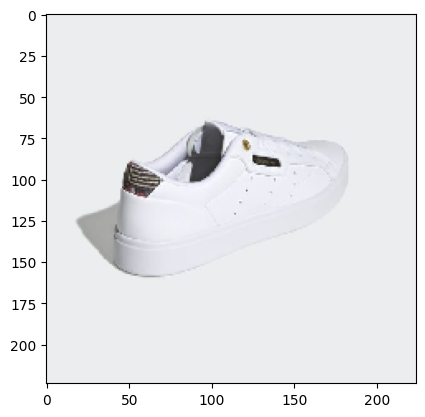

name:  datathon/adidas_sleek_shoes


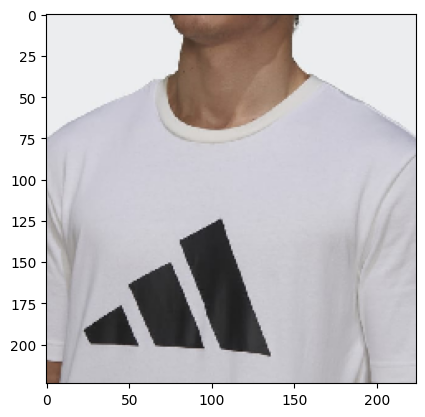

name:  datathon/adidas_sportswear_future_icons_logo_graphic_tee


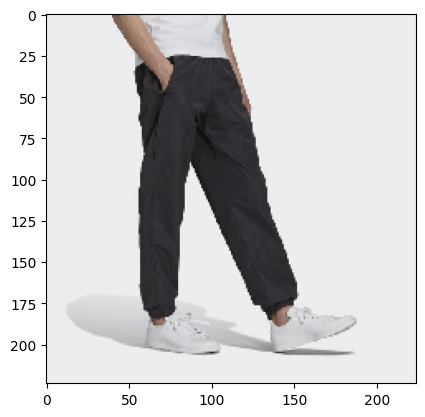

name:  datathon/adicolor_track_pants


In [8]:
item1 = 'datathon/adidas_sleek_shoes_image_5.jpg'
item2 = 'datathon/adidas_sportswear_future_icons_logo_graphic_tee_image_7.jpg'
item3 = 'datathon/adicolor_track_pants_image_3.jpg'
items = [item1, item2, item3]
for item in items:
    name = getID(item)
    original = load_img(item, target_size=(img_width, img_height))
    plt.imshow(original)
    plt.show()
    print("name: ", name)
n_recommendations = 50

## BRIDGE REGRESSION 

/Users/pianokill/miniconda3/envs/datathon/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:237: LinAlgWarning: Ill-conditioned matrix (rcond=7.31627e-10): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


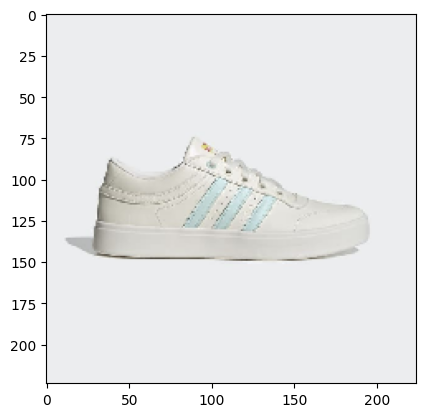

name:  datathon/bryony_shoes
rating:  0.00031977892


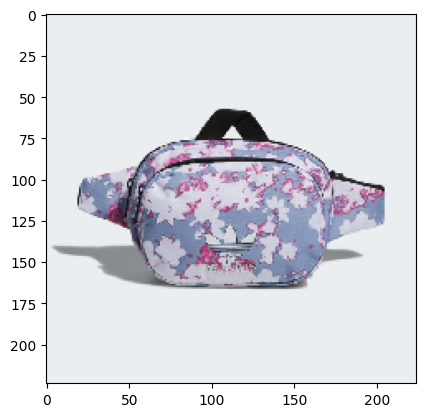

name:  datathon/sport_waist_pack
rating:  0.0003104806


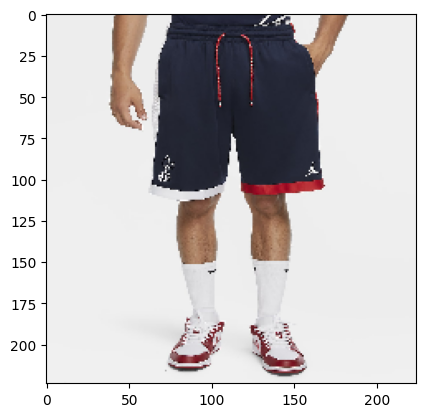

name:  datathon/jordan_france
rating:  0.00027662516


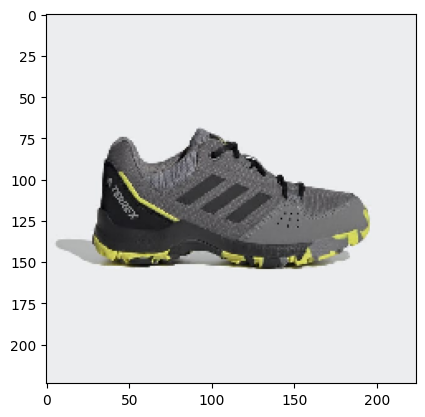

name:  datathon/terrex_hyperhiker_low_hiking_shoes
rating:  0.00025314093


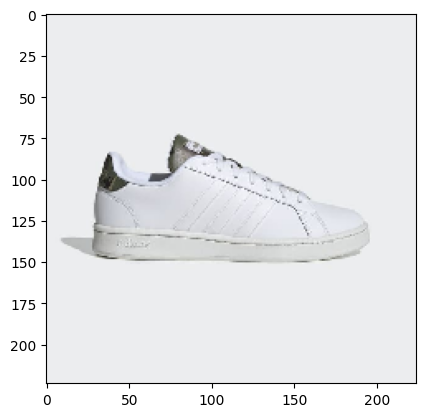

name:  datathon/grand_court_shoes
rating:  0.00023144484


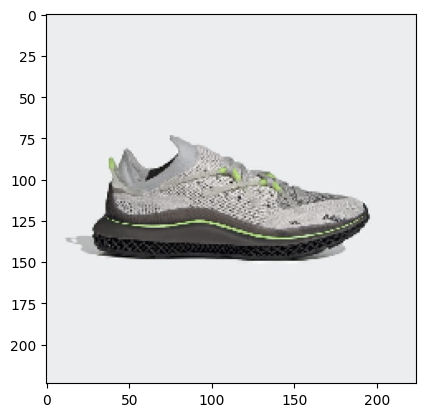

name:  datathon/4d_fusio_shoes
rating:  0.00023061037


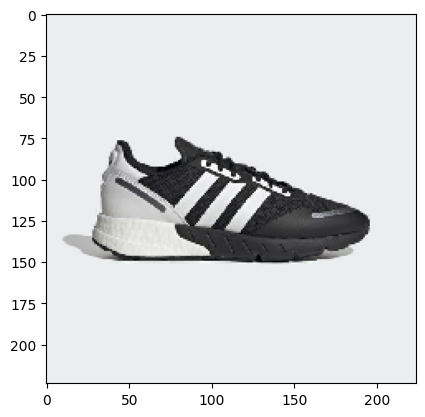

name:  datathon/zx_1k_boost_shoes
rating:  0.00021845102


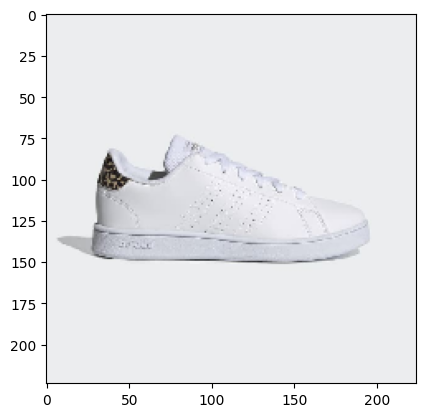

name:  datathon/advantage_shoes
rating:  0.00021409988


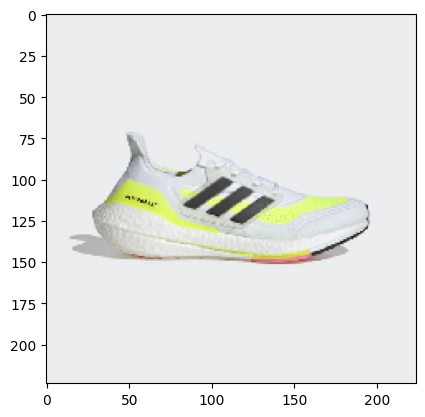

name:  datathon/ultraboost_21_shoes
rating:  0.00021141768


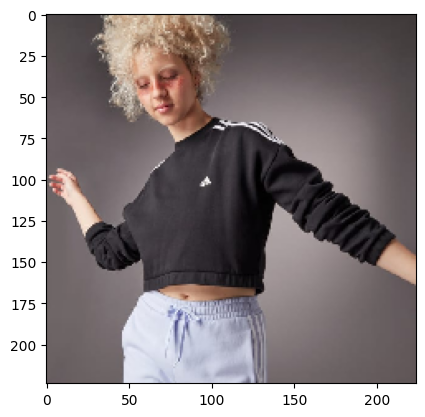

name:  datathon/hyperglam_crop_crew_sweatshirt
rating:  0.0002105236


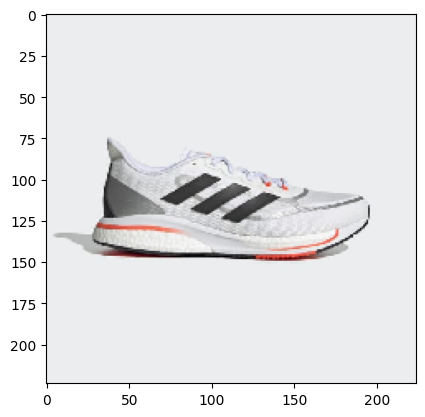

name:  datathon/supernova+_shoes
rating:  0.00019669533


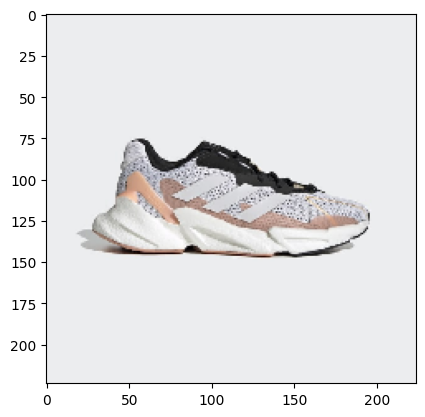

name:  datathon/x9000l4_shoes
rating:  0.00019279122


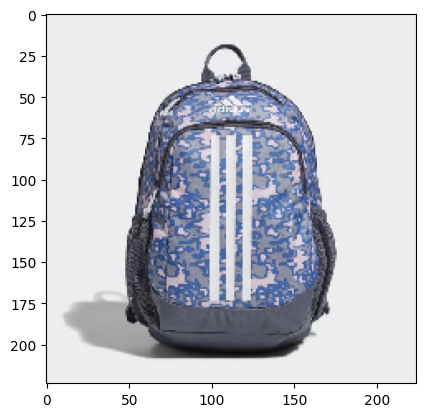

name:  datathon/creator_backpack
rating:  0.00018501282


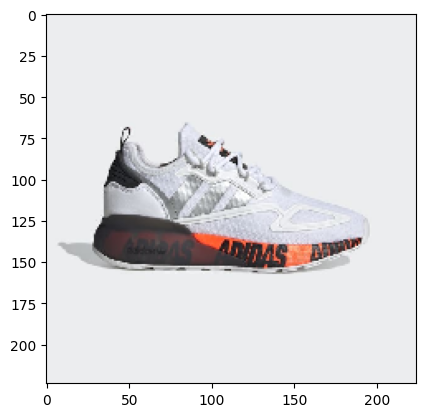

name:  datathon/zx_2k_boost_shoes
rating:  0.00017672777


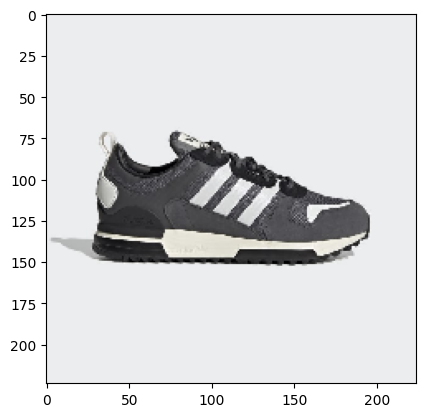

name:  datathon/zx_700_hd_shoes
rating:  0.0001681149


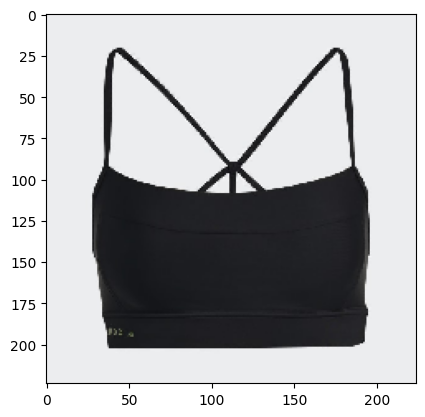

name:  datathon/karlie_kloss_bikini_top
rating:  0.00016212463


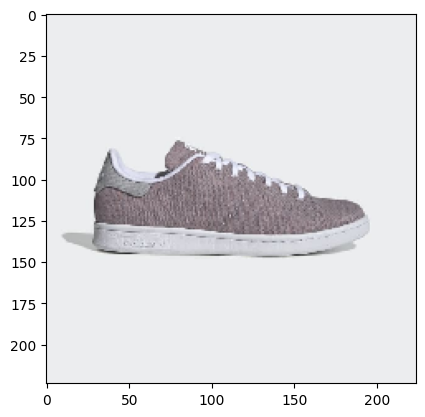

name:  datathon/stan_smith_shoes
rating:  0.00016129017


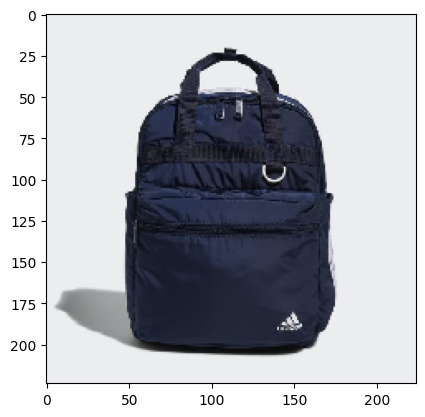

name:  datathon/essentials_backpack
rating:  0.00016093254


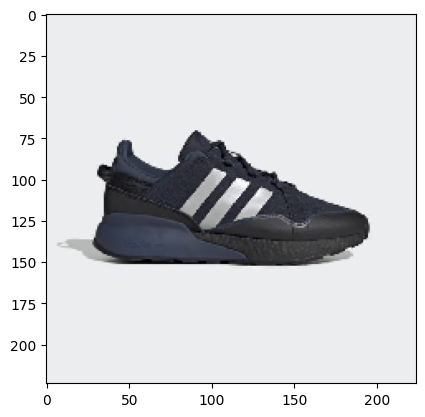

name:  datathon/zx_2k_boost_pure_shoes
rating:  0.00015050173


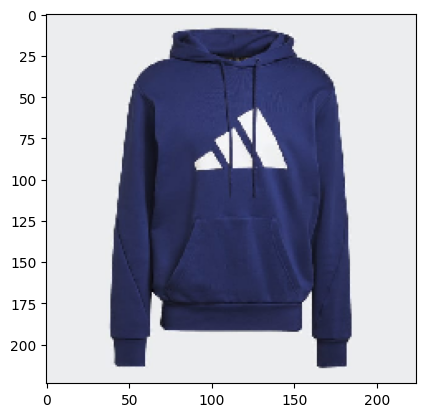

name:  datathon/adidas_sportswear_future_icons_logo_graphic_hoodie
rating:  0.00014919043


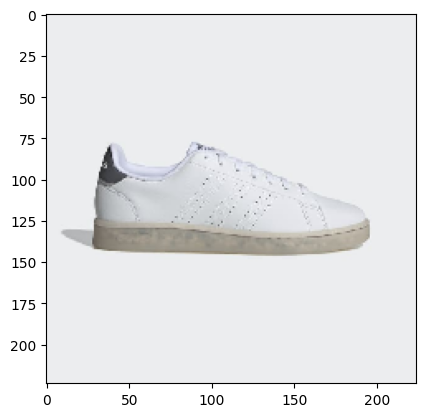

name:  datathon/advantage_eco_shoes
rating:  0.00014385581


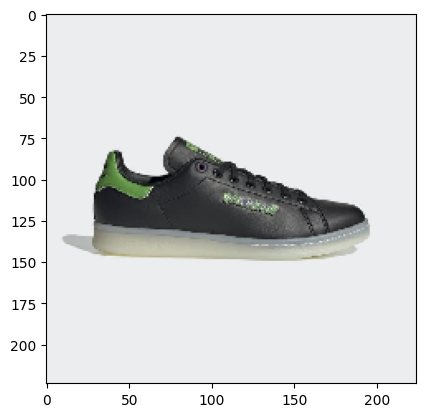

name:  datathon/hulk_stan_smith_shoes
rating:  0.0001398921


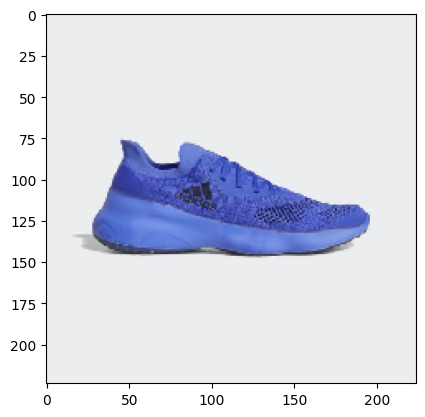

name:  datathon/futurenatural_shoes
rating:  0.00013458729


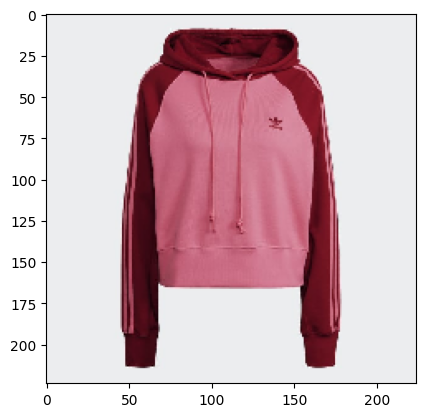

name:  datathon/adicolor_classics_collegiate_cropped_hoodie
rating:  0.00013387203


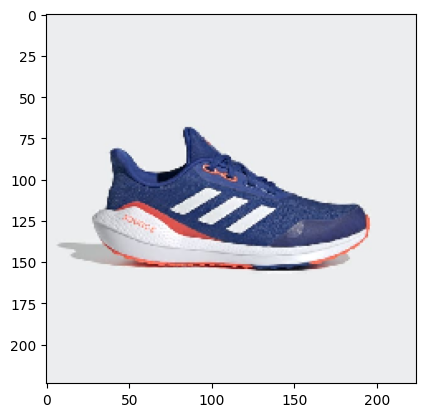

name:  datathon/eq21_run_shoes
rating:  0.0001308322


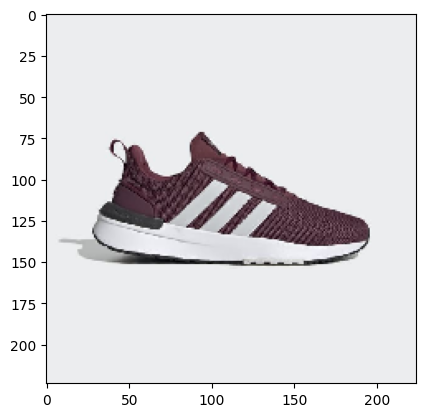

name:  datathon/racer_tr21_shoes
rating:  0.00012007356


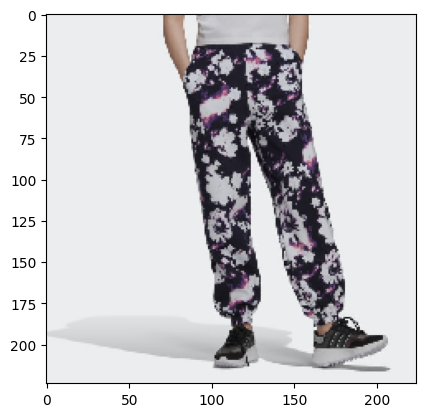

name:  datathon/track_pants
rating:  0.000119268894


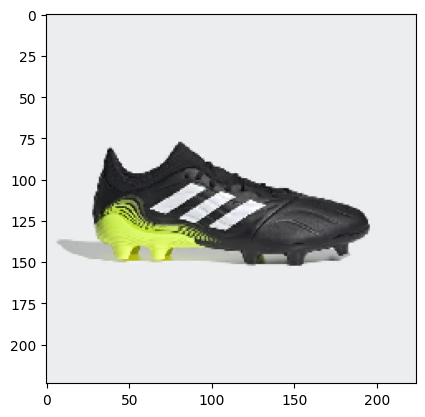

name:  datathon/copa_sense.3_firm_ground_cleats
rating:  0.00011897087


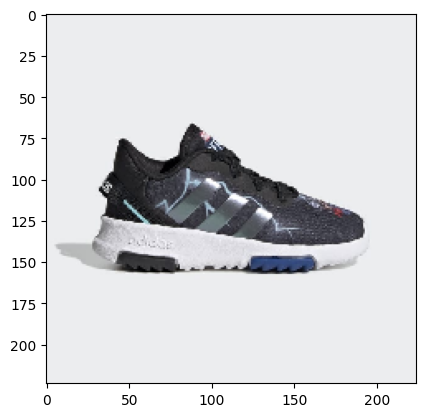

name:  datathon/marvel_superhero_racer_tr_2.0_shoes
rating:  0.00011771917


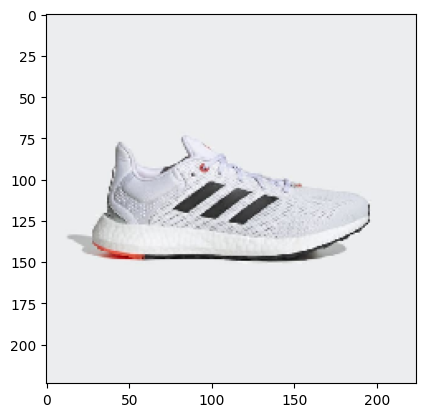

name:  datathon/pureboost_21_shoes
rating:  0.000116705894


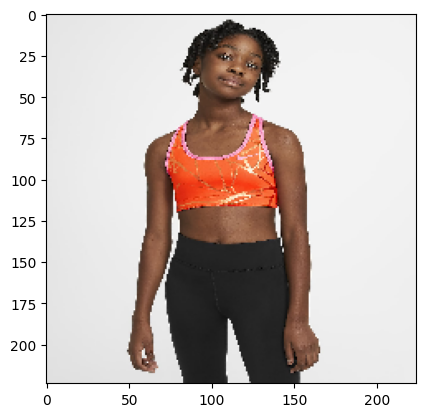

name:  datathon/nike_dri-fit_swoosh
rating:  0.00011527538


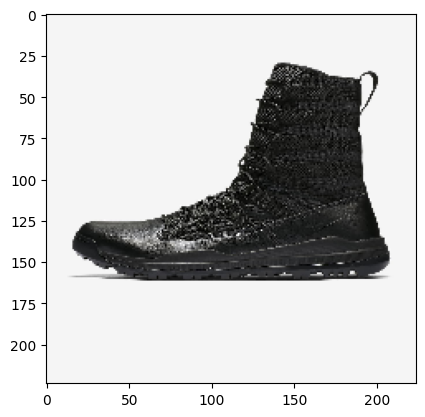

name:  datathon/nike_sfb_gen_2_8ó
rating:  0.00011360645


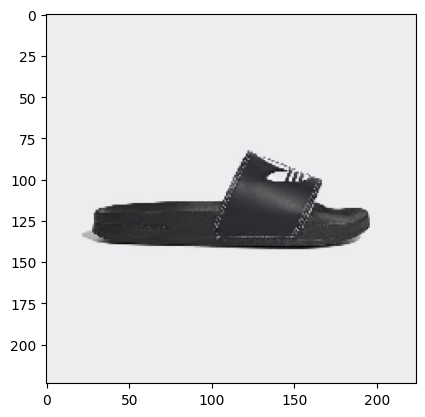

name:  datathon/adilette_lite_slides
rating:  0.00011244416


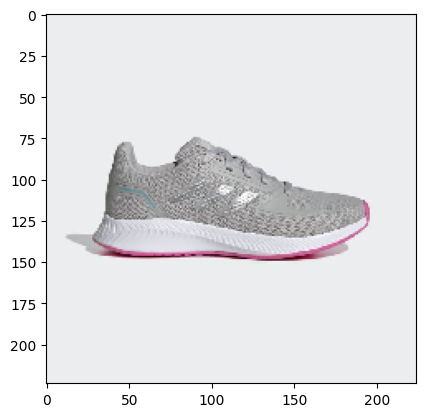

name:  datathon/runfalcon_2.0_shoes
rating:  0.00011178851


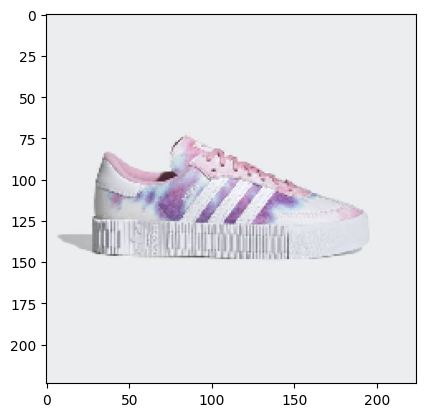

name:  datathon/sambarose_shoes
rating:  0.00011125207


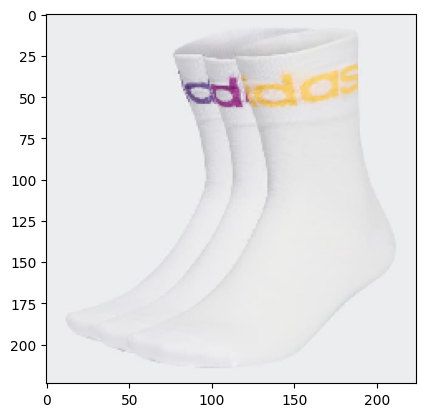

name:  datathon/fold-cuff_crew_socks_3_pairs
rating:  0.00011050701


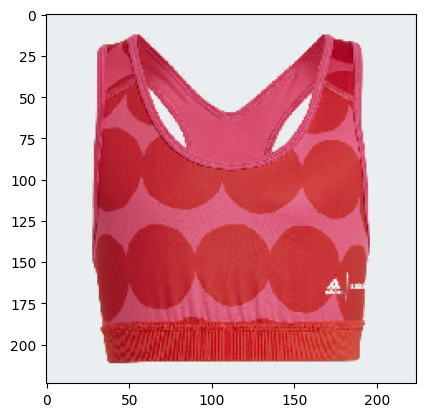

name:  datathon/marimekko_believe_this_primegreen_aeroready_training_bra
rating:  0.00010973215


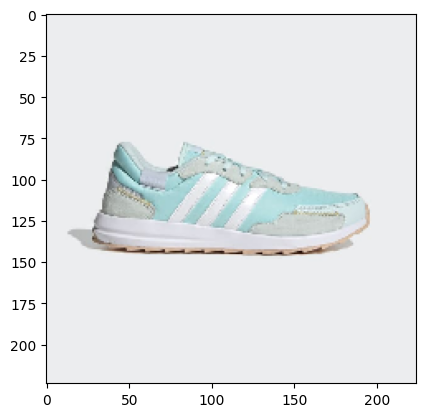

name:  datathon/retrorun_shoes
rating:  0.000109642744


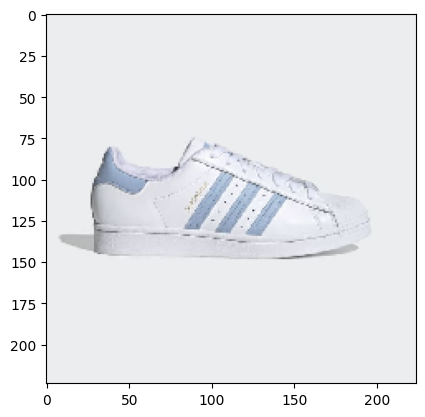

name:  datathon/superstar_shoes
rating:  0.00010818243


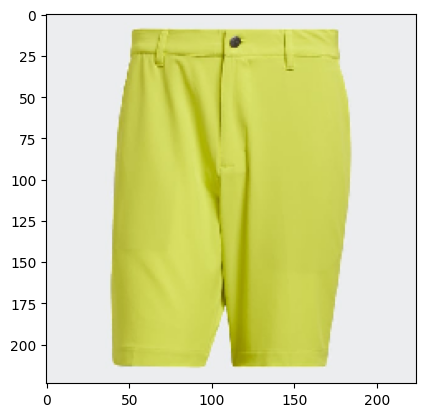

name:  datathon/ultimate365_core_8.5-inch_shorts
rating:  0.00010728836


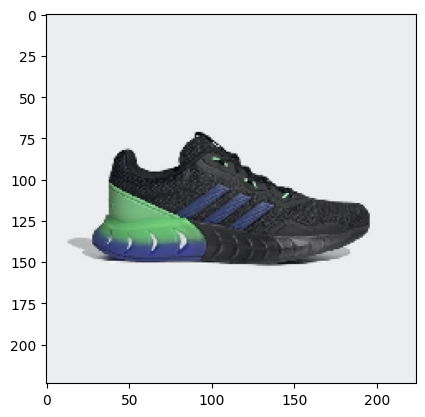

name:  datathon/kaptir_super_shoes
rating:  0.00010704994


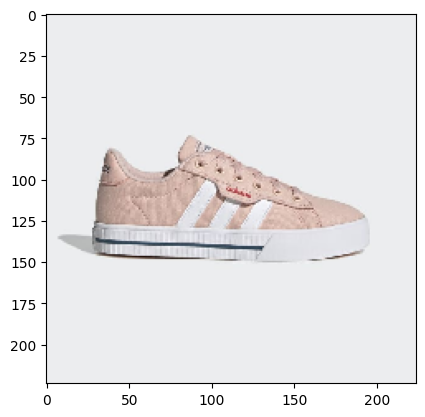

name:  datathon/daily_3.0_shoes
rating:  0.00010454655


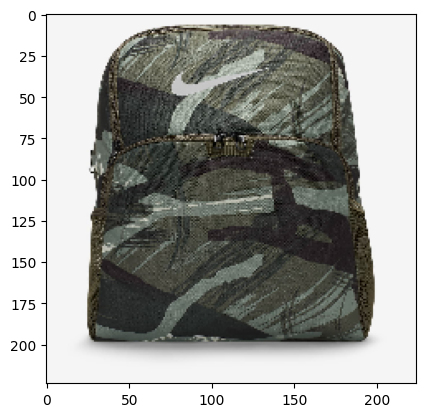

name:  datathon/nike_brasilia
rating:  0.00010371208


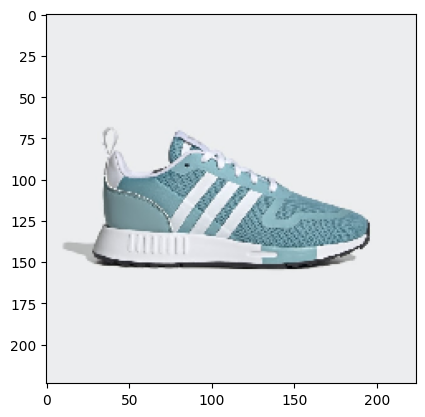

name:  datathon/multix_shoes
rating:  0.00010180473


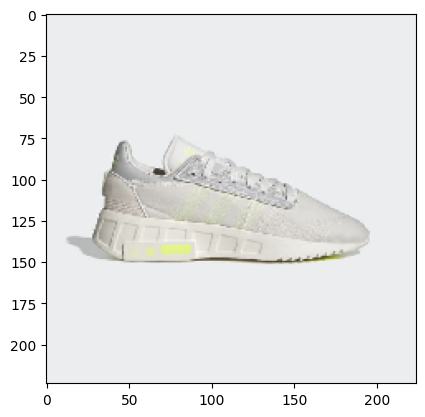

name:  datathon/geodiver_primeblue_shoes
rating:  0.00010114908


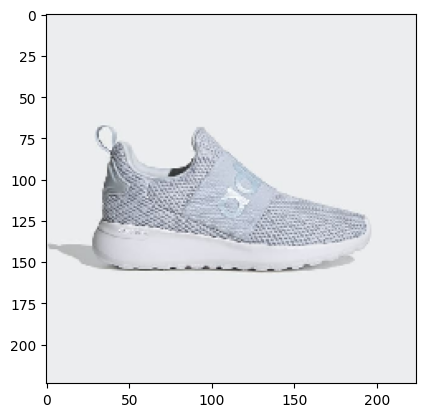

name:  datathon/lite_racer_adapt_4.0_shoes
rating:  0.000101059675


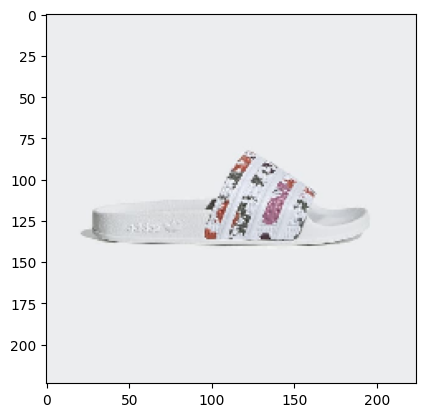

name:  datathon/adilette_slides
rating:  0.00010091066


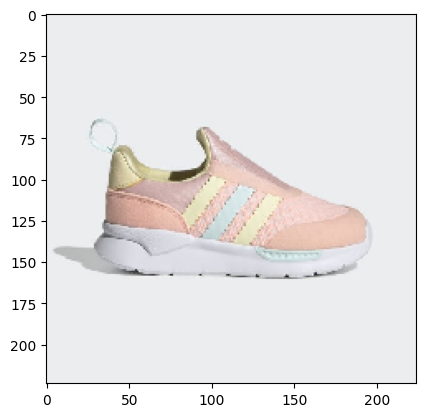

name:  datathon/zx_360_shoes
rating:  0.000100791454


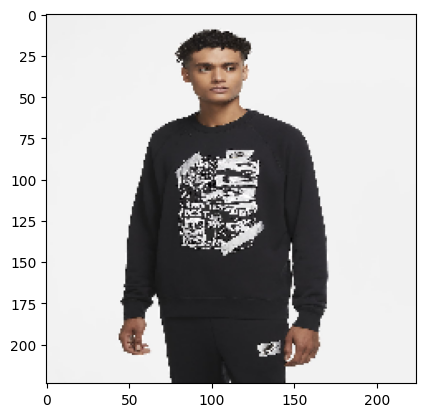

name:  datathon/nike_sportswear
rating:  9.918213e-05


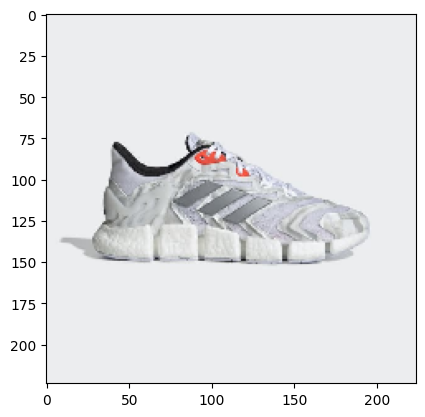

name:  datathon/climacool_vento_shoes
rating:  9.894371e-05


In [9]:
from sklearn import linear_model

scores = np.zeros(products_features.shape[0])
indices = [products.index.get_loc(idx) for idx in items]
scores[indices] = 1
clf = linear_model.Ridge(alpha=0.01, fit_intercept  = True)
clf.fit(products_features, scores)
w = clf.coef_
b = clf.intercept_
ratings = products_features.dot(w) + b
top_indices = np.argsort(ratings)[::-1]

i = 0
showed_items = items
showed_items = [getID(item) for item in showed_items]
existed = len(showed_items)
while(len(showed_items) - existed != n_recommendations):
    name = getID(files[top_indices[i]])
    if name in showed_items:
        i+=1
        continue
    if os.path.exists(name + "_image_1.jpg"):
        filename = name + "_image_1.jpg"
    elif os.path.exists(name + "_image_1.png"):
        filename = name + "_image_1.png"
    else:
        filename = files[top_indices[i]]
    original = load_img(filename, target_size=(img_width, img_height))
    plt.imshow(original)
    plt.show()
    print("name: ", name)
    print("rating: ", ratings[top_indices[i]])
    i+=1
    showed_items.append(name)

## AVERAGE FEATURES

In [10]:
indices = [products.index.get_loc(idx) for idx in items]
X = np.zeros(products_features.shape[1])
for index in indices:
    X = products_features[index] + X
X = X/len(indices)
vector_cosine = cosine_similarity(X.reshape(1, -1), products_features)
vector_cosine = vector_cosine.reshape(-1)
top_indices = np.argsort(vector_cosine)[::-1]

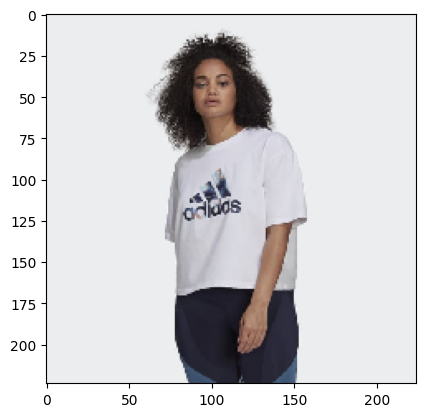

name:  datathon/adidas_x_zoe_saldana_crop_logo_tee_(plus_size)
rating:  0.9497234360087837


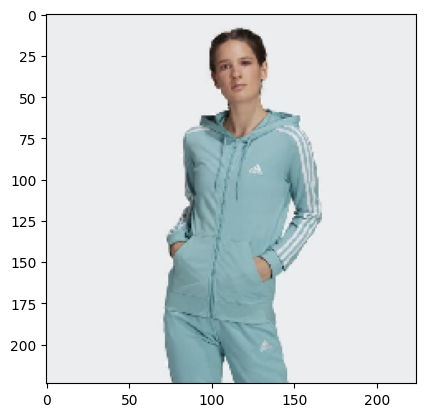

name:  datathon/essentials_3-stripes_full-zip_hoodie
rating:  0.9462256385694616


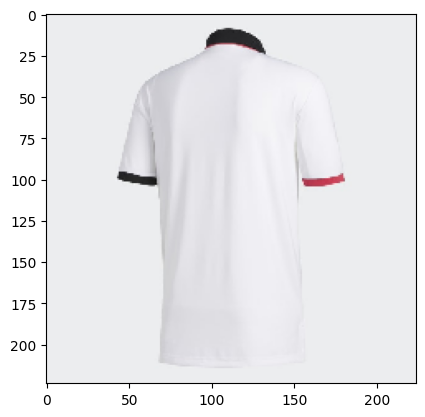

name:  datathon/ultimate365_3-stripes_polo_shirt
rating:  0.9462105917770116


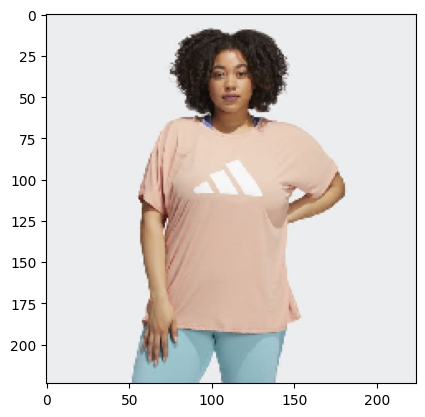

name:  datathon/3-stripes_training_tee_(plus_size)
rating:  0.945476264815033


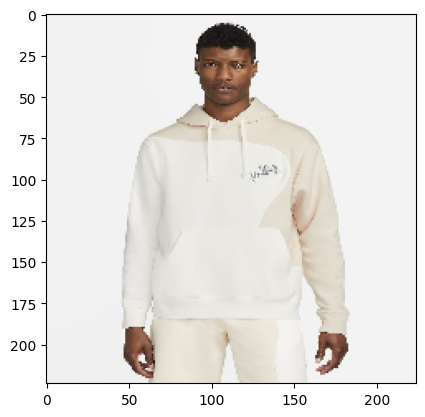

name:  datathon/nike_sportswear_club
rating:  0.9421722362763516


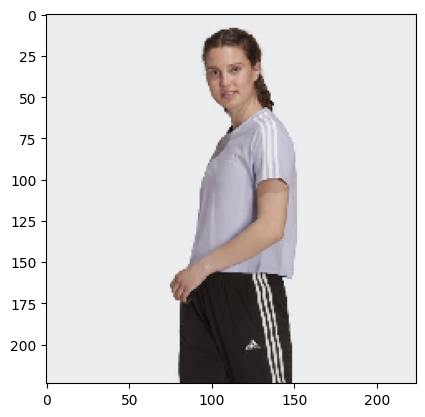

name:  datathon/essentials_loose_3-stripes_cropped_tee
rating:  0.9416942584359195


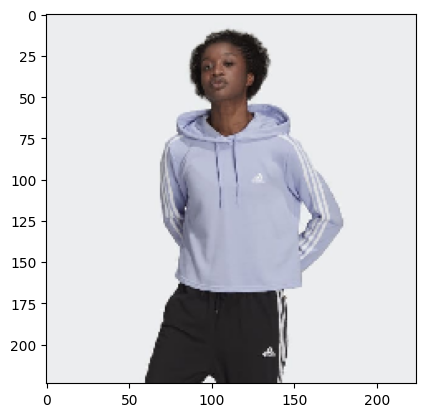

name:  datathon/essentials_3-stripes_cropped_hoodie
rating:  0.9410121231186613


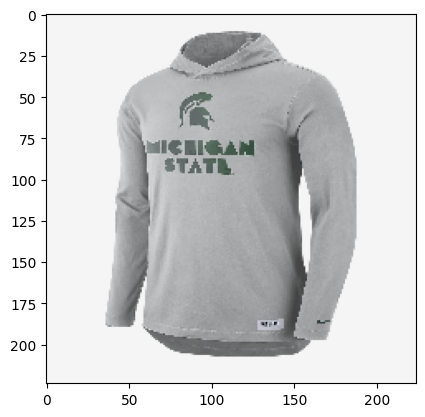

name:  datathon/nike_college_dri-fit_(michigan_state)
rating:  0.9392073940453172


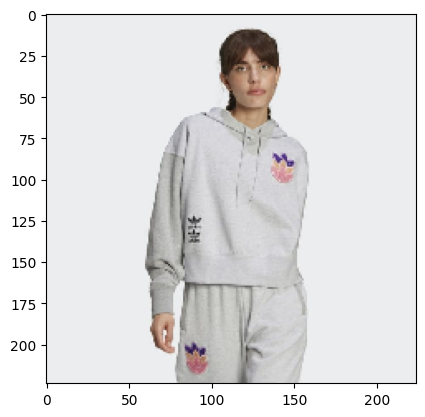

name:  datathon/logo_play_cropped_hoodie
rating:  0.9388512715011811


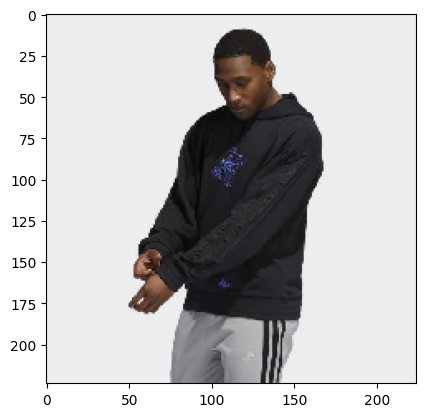

name:  datathon/lil_stripe_ignite_szn_hoodie
rating:  0.9388008314570614


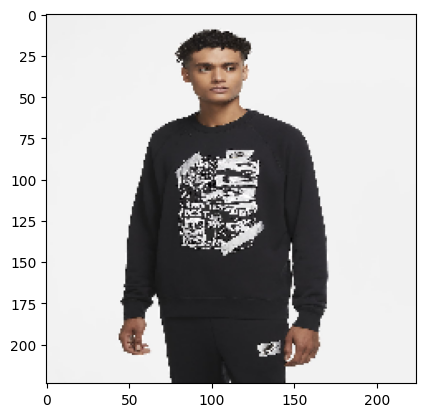

name:  datathon/nike_sportswear
rating:  0.9357984776279289


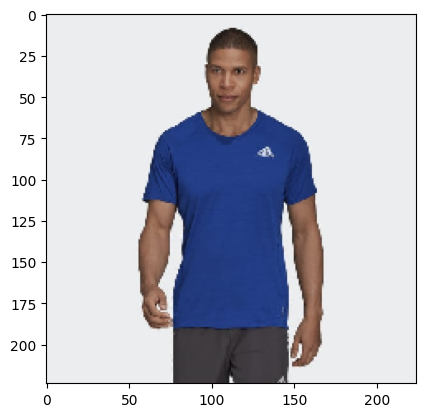

name:  datathon/runner_tee
rating:  0.9349299908347752


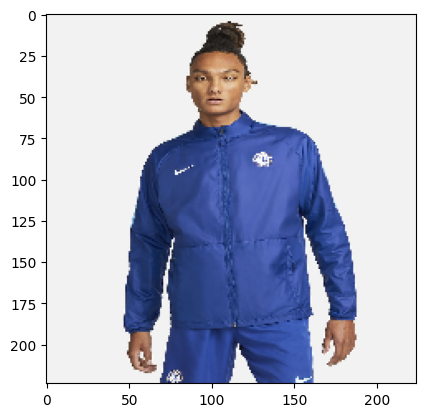

name:  datathon/chelsea_fc_repel_academy_awf
rating:  0.9344753122753098


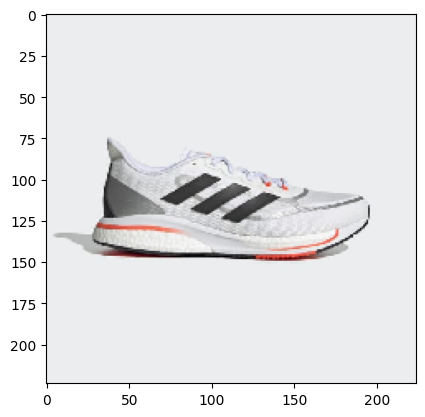

name:  datathon/supernova+_shoes
rating:  0.9342201839148477


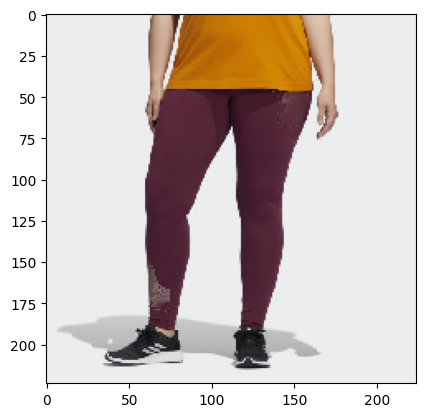

name:  datathon/holiday_graphic_tights_(plus_size)
rating:  0.9340593484037966


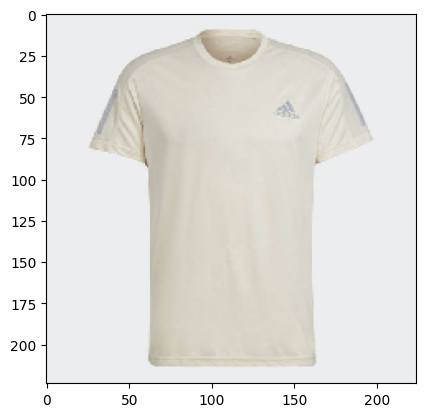

name:  datathon/own_the_run_tee
rating:  0.9340071731410233


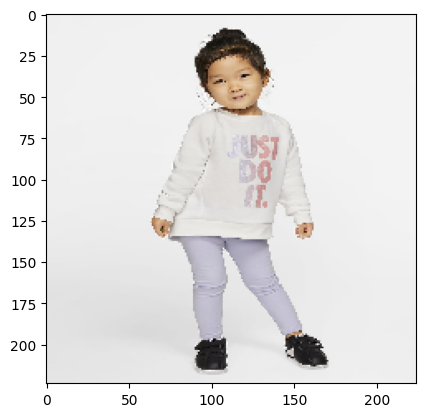

name:  datathon/nike
rating:  0.9337341573130915


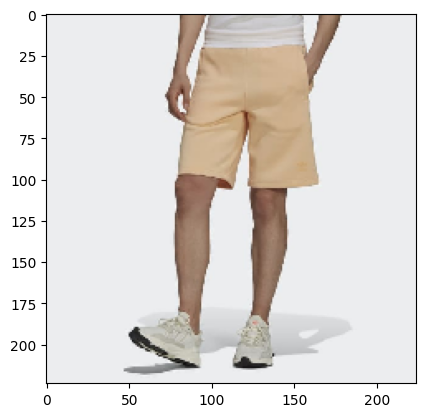

name:  datathon/adicolor_classics_mm_trefoil_shorts
rating:  0.9332822623193282


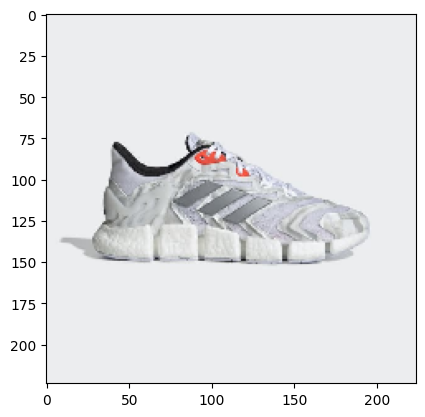

name:  datathon/climacool_vento_shoes
rating:  0.9322034658788227


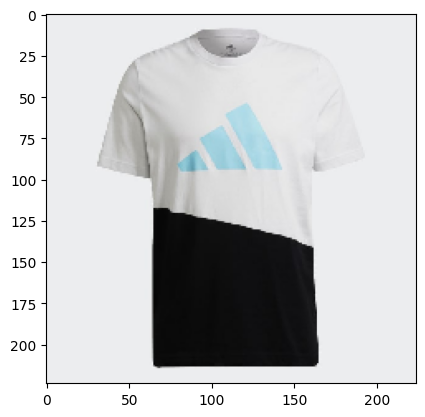

name:  datathon/graphic_tee
rating:  0.9312353688241439


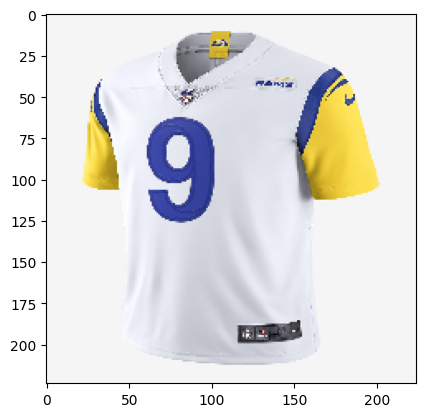

name:  datathon/nfl_los_angeles_rams_nike_vapor_untouchable_(matthew_stafford)
rating:  0.9306974574204837


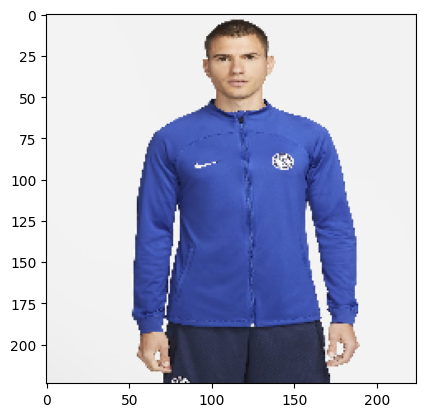

name:  datathon/chelsea_fc_strike
rating:  0.9301260065273834


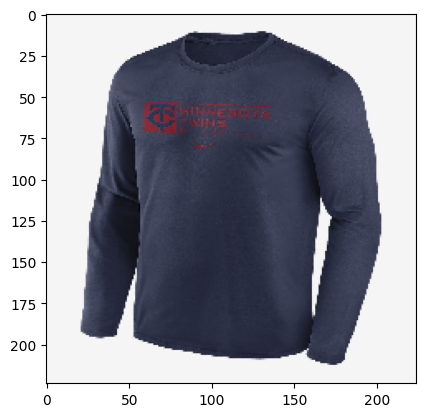

name:  datathon/nike_dri-fit_team_(mlb_minnesota_twins)
rating:  0.929583956783832


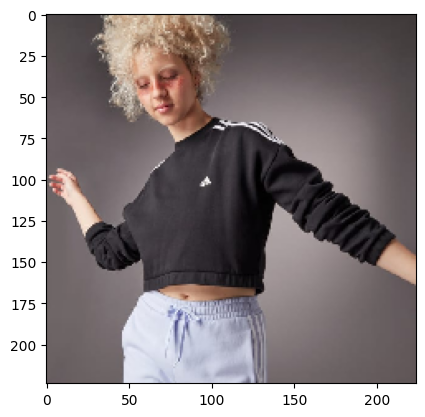

name:  datathon/hyperglam_crop_crew_sweatshirt
rating:  0.9294171338340309


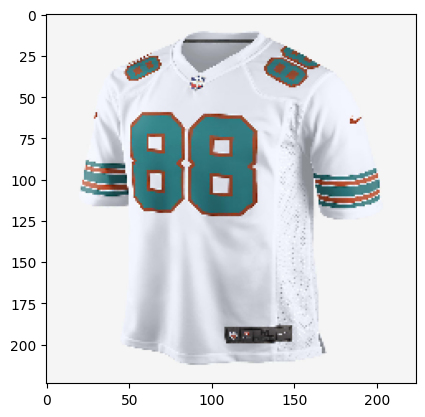

name:  datathon/nfl_miami_dolphins_(mike_gesicki)
rating:  0.929386344303055


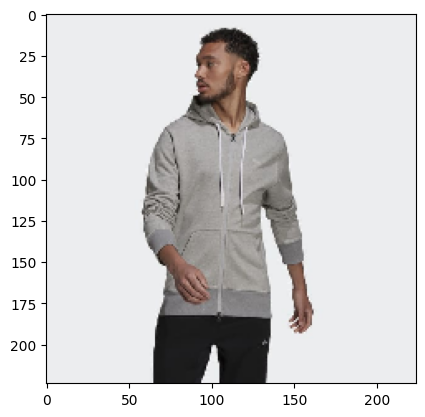

name:  datathon/adidas_sportswear_comfy_&_chill_full_zip_hoodie
rating:  0.929380518915483


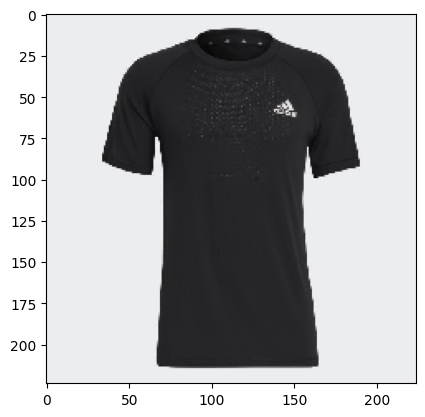

name:  datathon/aeroknit_designed_2_move_sport_seamless_tee
rating:  0.9291543903918169


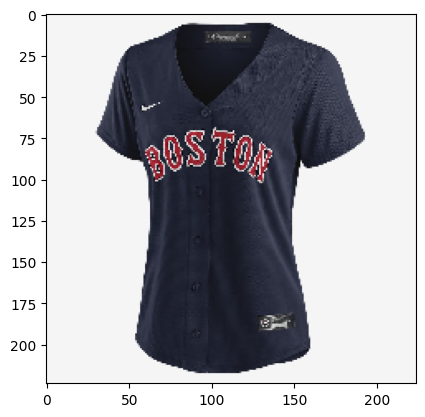

name:  datathon/mlb_boston_red_sox_(andrew_benintendi)
rating:  0.9291043065457149


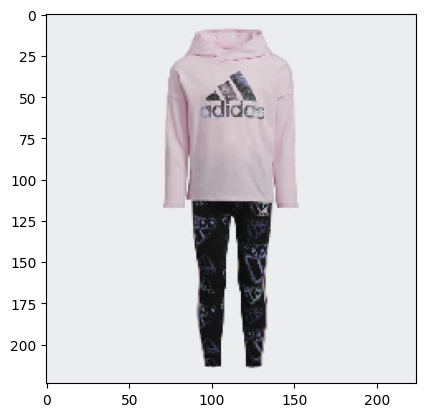

name:  datathon/long_sleeve_tee_and_printed_tights_set
rating:  0.9288096554004335


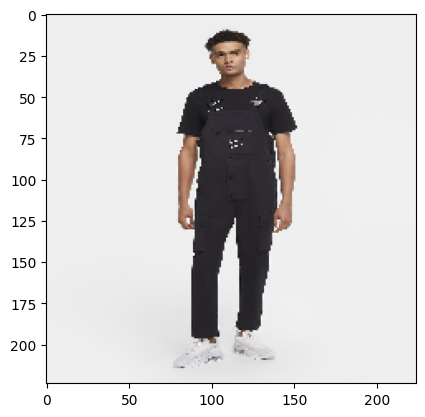

name:  datathon/nike_sportswear_swoosh
rating:  0.9287280803052497


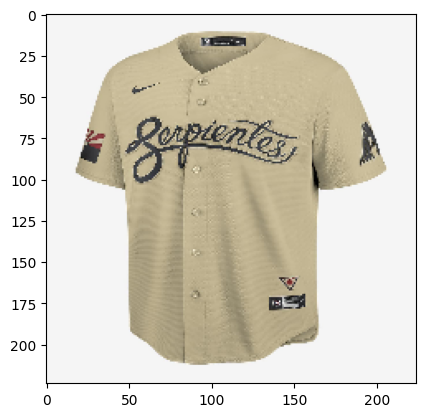

name:  datathon/mlb_arizona_diamondbacks_city_connect
rating:  0.9285213034075216


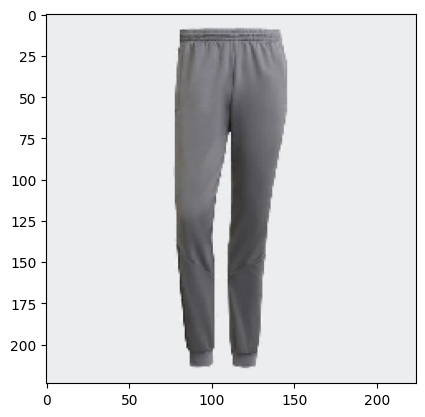

name:  datathon/adidas_sprt_colorblock_track_pants
rating:  0.9284343848187642


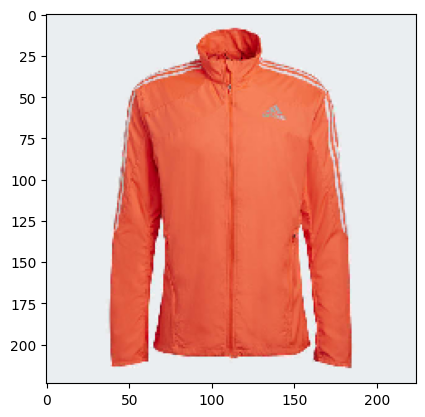

name:  datathon/marathon_3-stripes_jacket
rating:  0.92835945542399


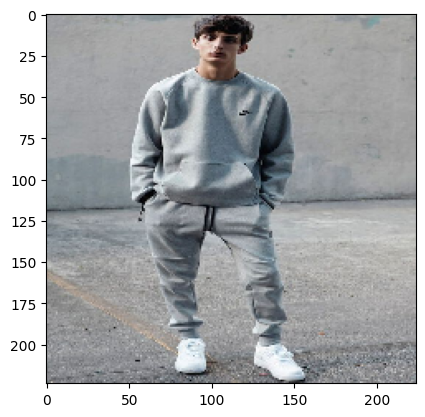

name:  datathon/test
rating:  0.9279526506367426


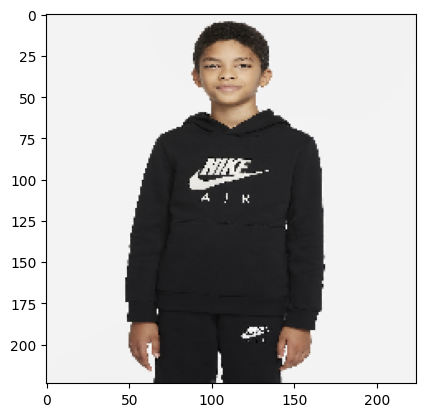

name:  datathon/nike_air
rating:  0.9276294318168077


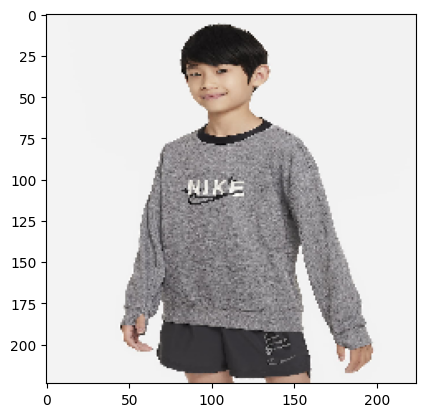

name:  datathon/nike_dri-fit_performance_select
rating:  0.9273613848360818


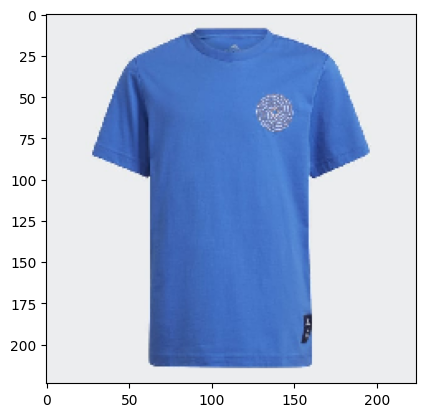

name:  datathon/real_madrid_tee
rating:  0.926243083856744


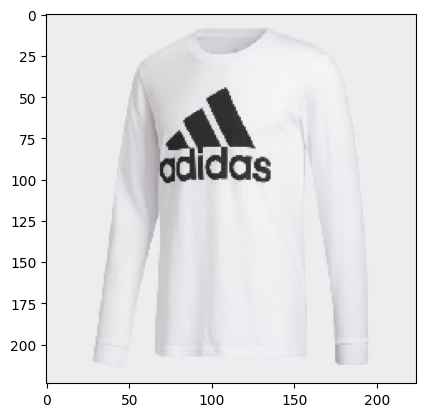

name:  datathon/badge_of_sport_tee
rating:  0.926231391293751


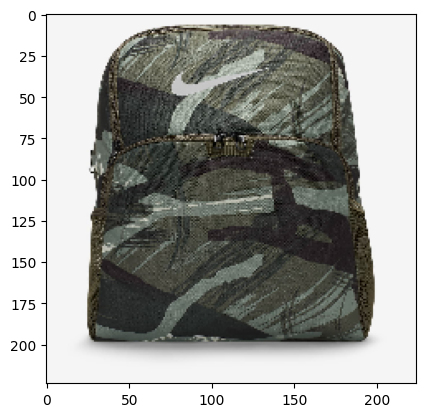

name:  datathon/nike_brasilia
rating:  0.9259913307671237


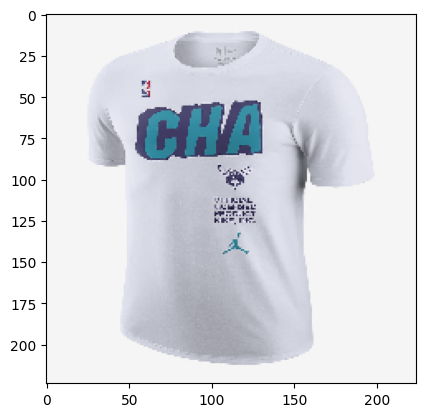

name:  datathon/charlotte_hornets
rating:  0.923590528709976


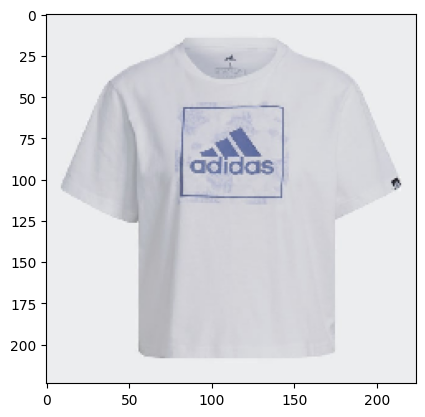

name:  datathon/flower_camo_box_graphic_tee
rating:  0.9233212379650467


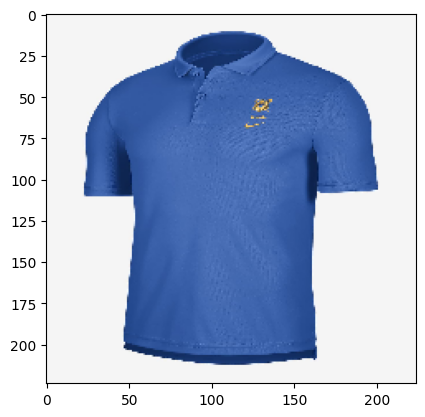

name:  datathon/nike_college_dri-fit_(ucla)
rating:  0.9230950056727609


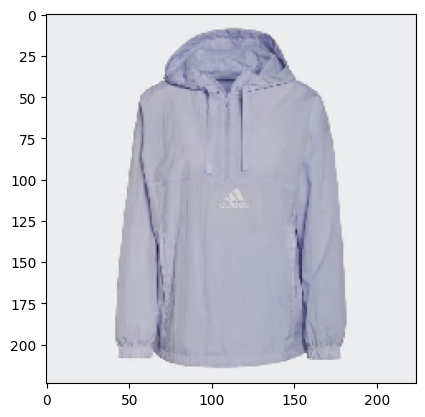

name:  datathon/brand_love_repeat_logo_half-zip_windbreaker
rating:  0.9230732236366705


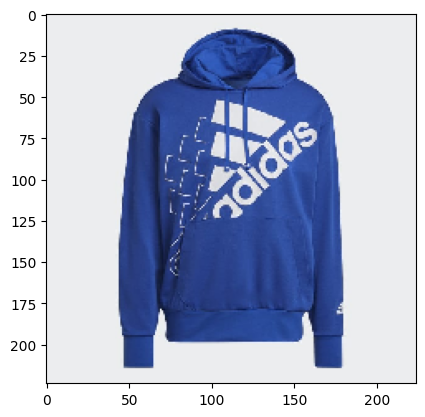

name:  datathon/essentials_logo_hoodie_(gender_neutral)
rating:  0.9229256348368167


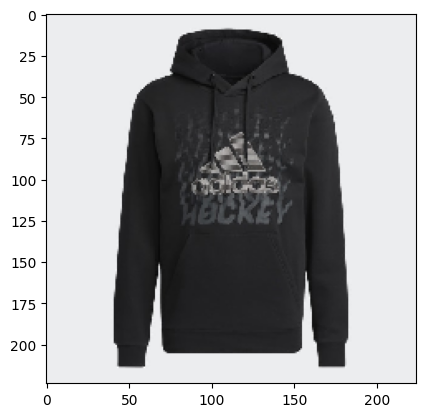

name:  datathon/adidas_hockey_hoodie
rating:  0.9228938567337439


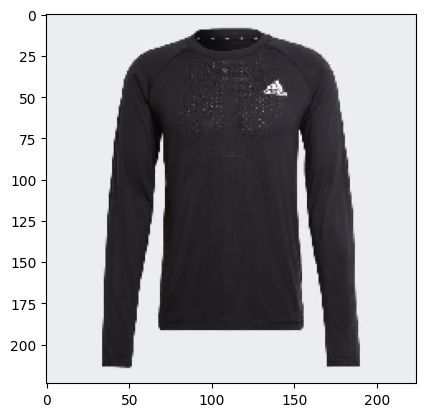

name:  datathon/aeroknit_designed_2_move_sport_seamless_long_sleeve_tee
rating:  0.9227344031278844


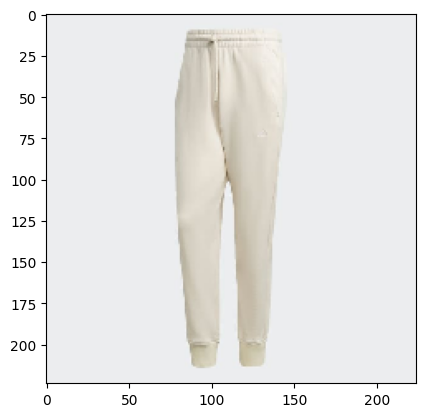

name:  datathon/adidas_sportswear_comfy_&_chill_pants
rating:  0.922474182062734


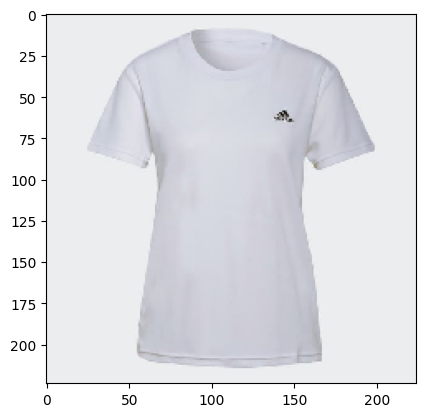

name:  datathon/aeroready_designed_2_move_sport_tee
rating:  0.9214758693452632


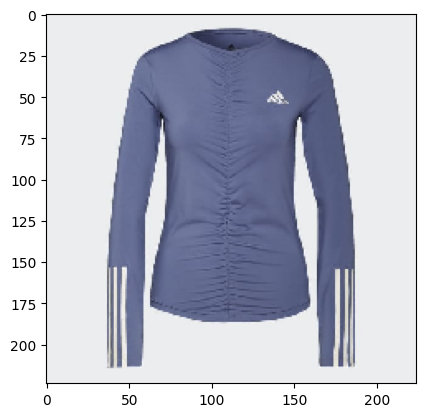

name:  datathon/aeroready_breathable_3-stripes_long_sleeve_tee
rating:  0.9214562982411405


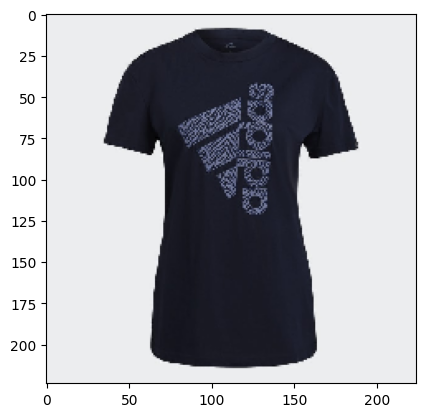

name:  datathon/zebra_logo_graphic_tee
rating:  0.9209886346625794


In [11]:
i = 0
showed_items = items
showed_items = [getID(item) for item in showed_items]
existed = len(showed_items)
while(len(showed_items) - existed != n_recommendations):
    name = getID(files[top_indices[i]])
    if name in showed_items:
        i+=1
        continue
    if os.path.exists(name + "_image_1.jpg"):
        filename = name + "_image_1.jpg"
    elif os.path.exists(name + "_image_1.png"):
        filename = name + "_image_1.png"
    else:
        filename = files[top_indices[i]]
    original = load_img(filename, target_size=(img_width, img_height))
    plt.imshow(original)
    plt.show()
    print("name: ", name)
    print("rating: ", vector_cosine[top_indices[i]])
    i+=1
    showed_items.append(name)

## COSINE SIMILARITY + RIDGE REGRESSION

In [12]:
def calculate_cosine(vector1, vector2):
    dot_product = np.dot(vector1, vector2)
    norm_vector1 = np.linalg.norm(vector1)
    norm_vector2 = np.linalg.norm(vector2)

    similarity = dot_product / (norm_vector1 * norm_vector2)

    return similarity

In [13]:
vector_cosine = np.zeros(products.shape[0])
for item in items:
    item_features = np.array(products.loc[item])
    cosine_similarity = []
    for i in range(0, products.shape[0]):
        item_i = np.array(products_features[i,:])
        cosine_similarity.append(calculate_cosine(item_features, item_i))
    cosine_similarity = np.array(cosine_similarity)
    vector_cosine = vector_cosine + cosine_similarity
vector_cosine = vector_cosine/len(items)

/Users/pianokill/miniconda3/envs/datathon/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:237: LinAlgWarning: Ill-conditioned matrix (rcond=7.31627e-10): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


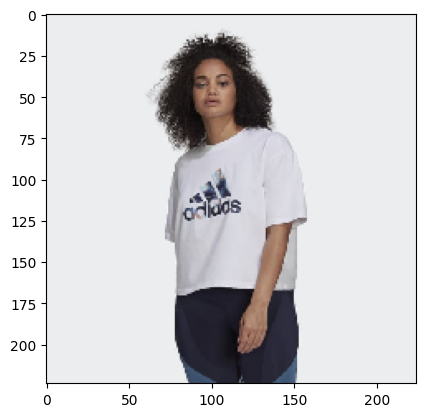

name:  datathon/adidas_x_zoe_saldana_crop_logo_tee_(plus_size)
rating:  0.8618729


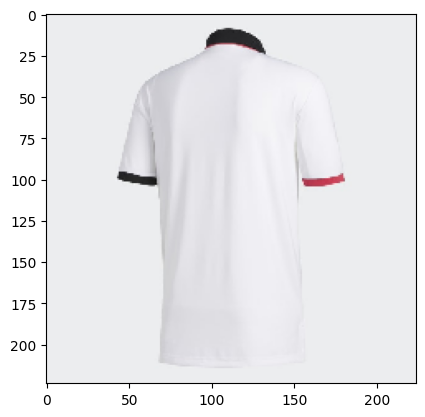

name:  datathon/ultimate365_3-stripes_polo_shirt
rating:  0.86010253


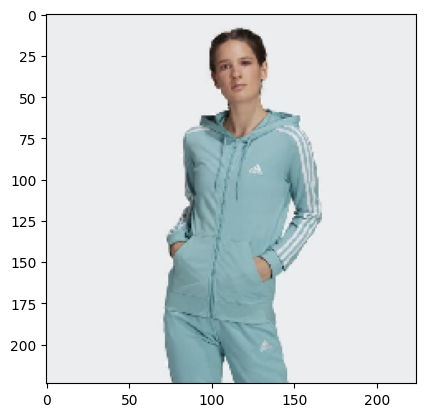

name:  datathon/essentials_3-stripes_full-zip_hoodie
rating:  0.8590441


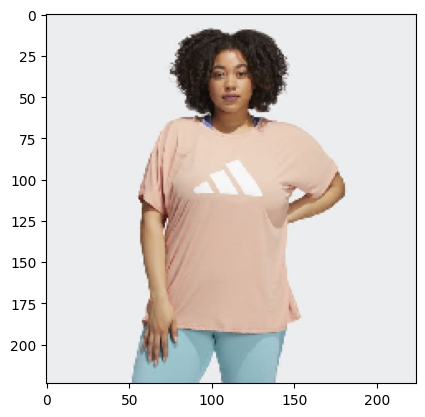

name:  datathon/3-stripes_training_tee_(plus_size)
rating:  0.85742587


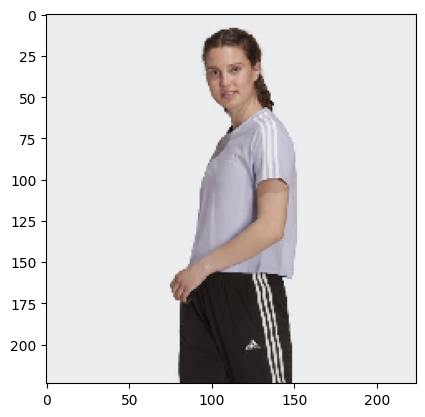

name:  datathon/essentials_loose_3-stripes_cropped_tee
rating:  0.85411775


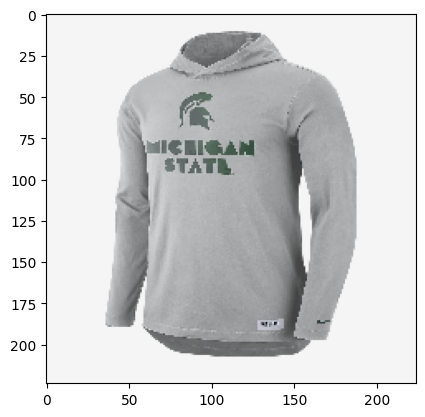

name:  datathon/nike_college_dri-fit_(michigan_state)
rating:  0.85407585


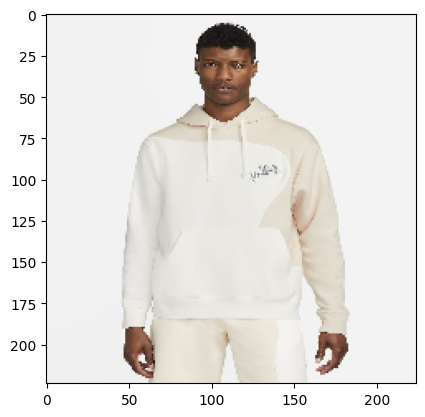

name:  datathon/nike_sportswear_club
rating:  0.85383505


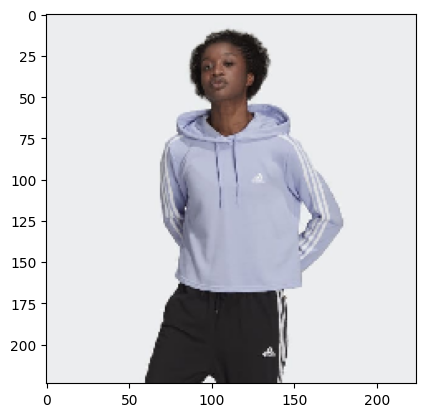

name:  datathon/essentials_3-stripes_cropped_hoodie
rating:  0.8532874


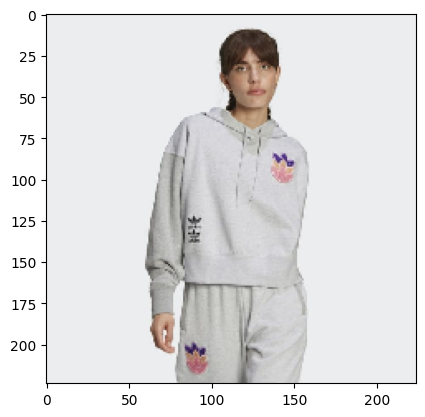

name:  datathon/logo_play_cropped_hoodie
rating:  0.8520042


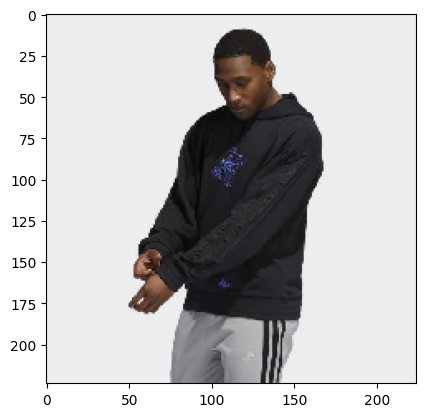

name:  datathon/lil_stripe_ignite_szn_hoodie
rating:  0.8514383


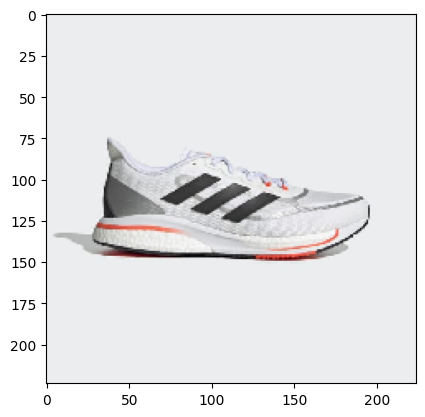

name:  datathon/supernova+_shoes
rating:  0.8493045


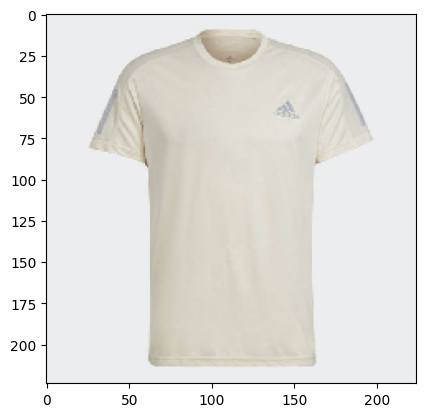

name:  datathon/own_the_run_tee
rating:  0.84911084


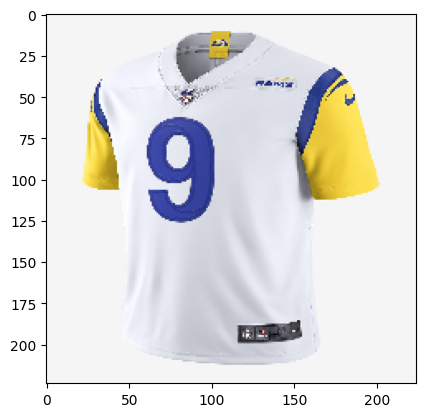

name:  datathon/nfl_los_angeles_rams_nike_vapor_untouchable_(matthew_stafford)
rating:  0.848364


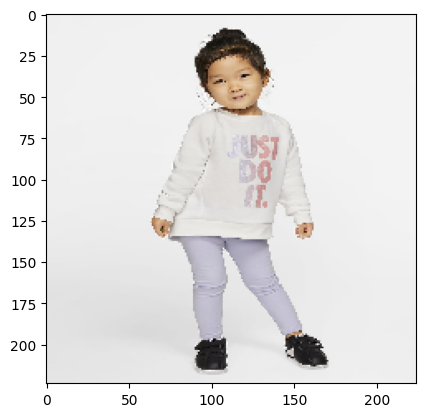

name:  datathon/nike
rating:  0.84836185


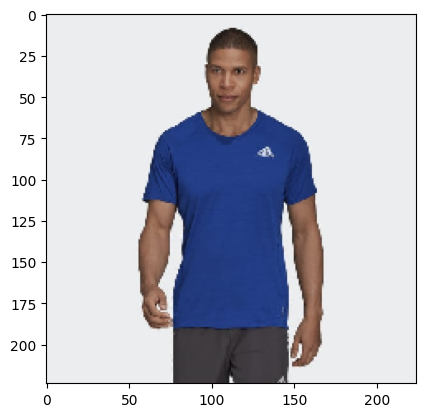

name:  datathon/runner_tee
rating:  0.8476295


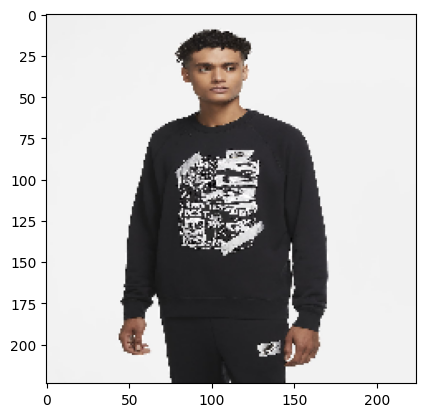

name:  datathon/nike_sportswear
rating:  0.84750855


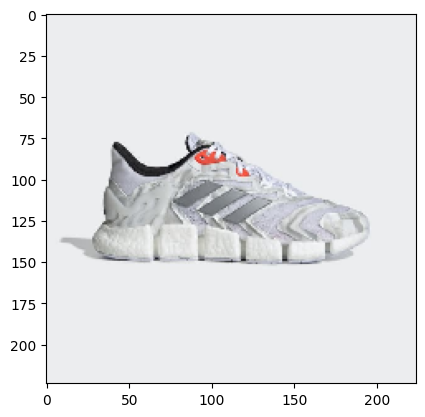

name:  datathon/climacool_vento_shoes
rating:  0.8475018


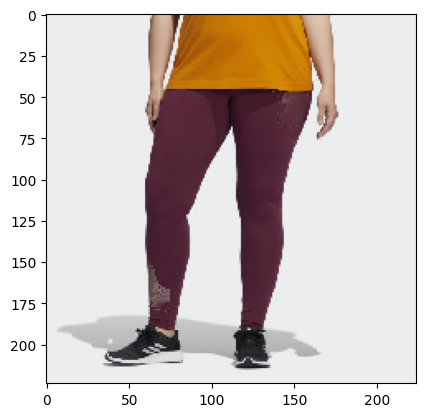

name:  datathon/holiday_graphic_tights_(plus_size)
rating:  0.8469639


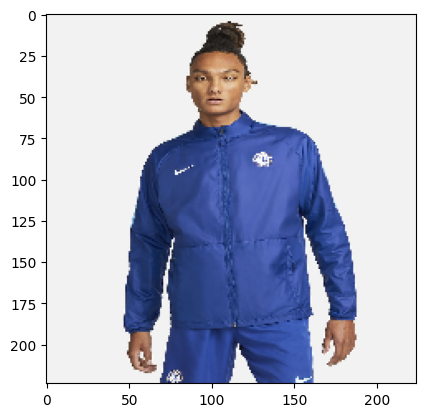

name:  datathon/chelsea_fc_repel_academy_awf
rating:  0.84662116


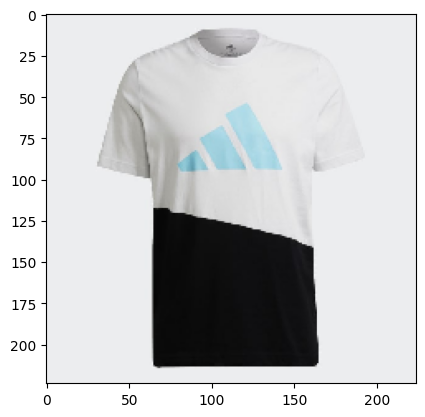

name:  datathon/graphic_tee
rating:  0.8463426


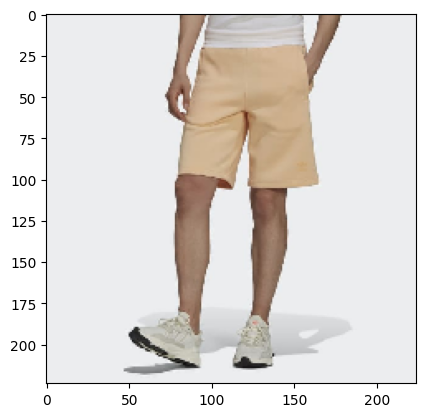

name:  datathon/adicolor_classics_mm_trefoil_shorts
rating:  0.8461619


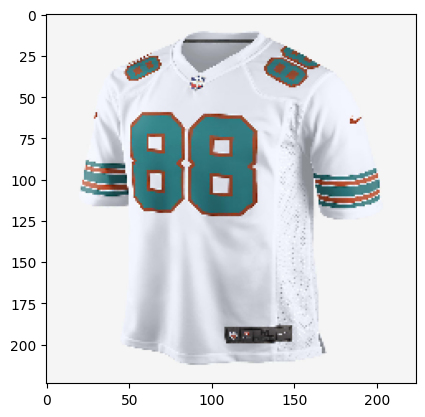

name:  datathon/nfl_miami_dolphins_(mike_gesicki)
rating:  0.84582263


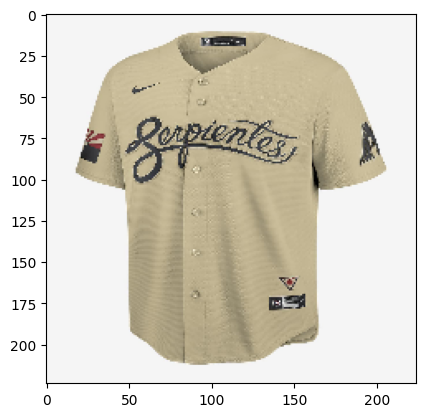

name:  datathon/mlb_arizona_diamondbacks_city_connect
rating:  0.8448534


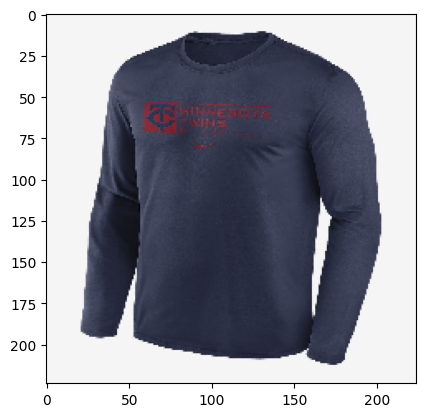

name:  datathon/nike_dri-fit_team_(mlb_minnesota_twins)
rating:  0.84326905


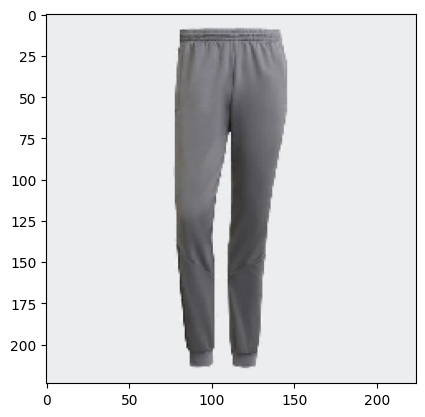

name:  datathon/adidas_sprt_colorblock_track_pants
rating:  0.8431615


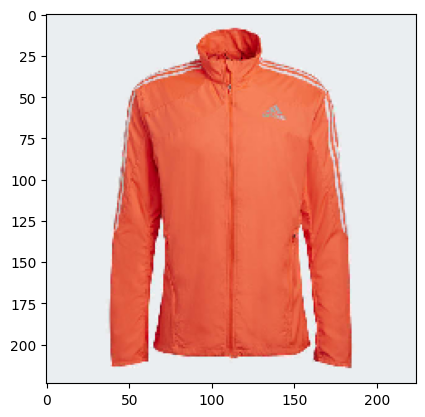

name:  datathon/marathon_3-stripes_jacket
rating:  0.8430833


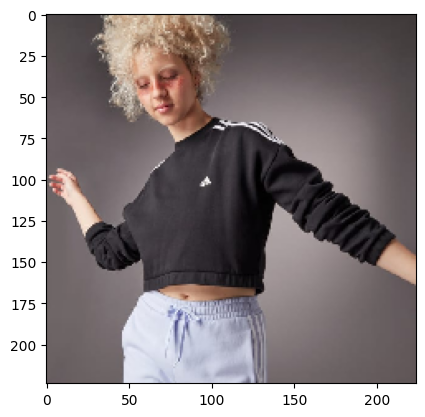

name:  datathon/hyperglam_crop_crew_sweatshirt
rating:  0.84301573


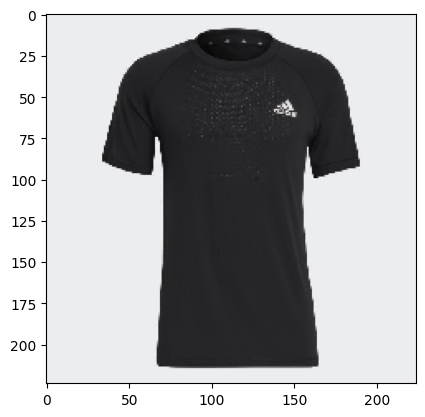

name:  datathon/aeroknit_designed_2_move_sport_seamless_tee
rating:  0.8429005


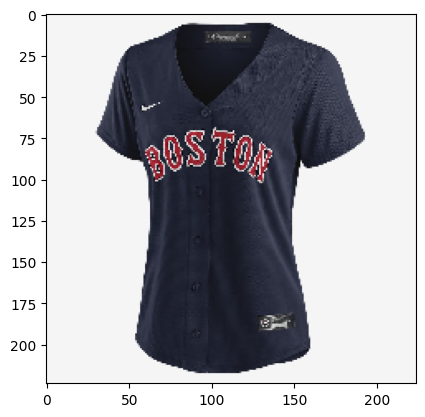

name:  datathon/mlb_boston_red_sox_(andrew_benintendi)
rating:  0.84285975


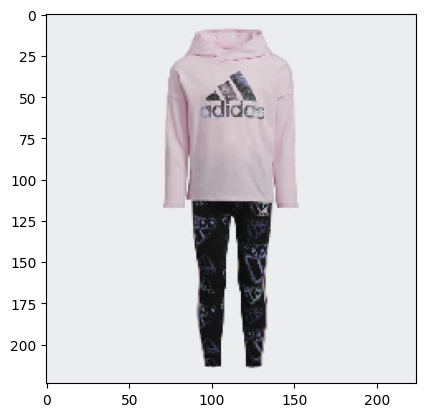

name:  datathon/long_sleeve_tee_and_printed_tights_set
rating:  0.84275913


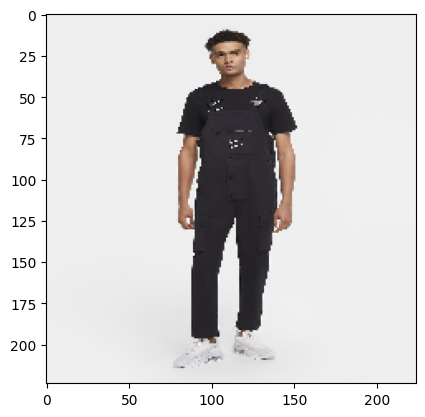

name:  datathon/nike_sportswear_swoosh
rating:  0.842515


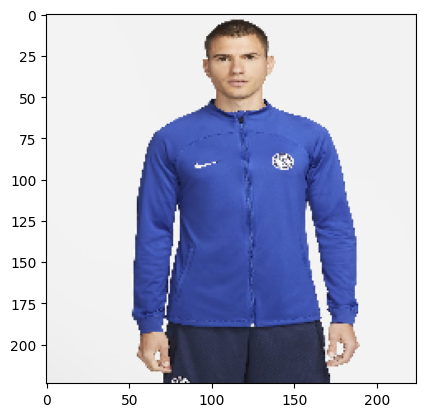

name:  datathon/chelsea_fc_strike
rating:  0.8424593


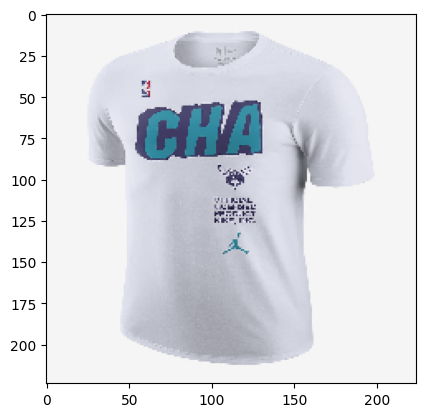

name:  datathon/charlotte_hornets
rating:  0.84244466


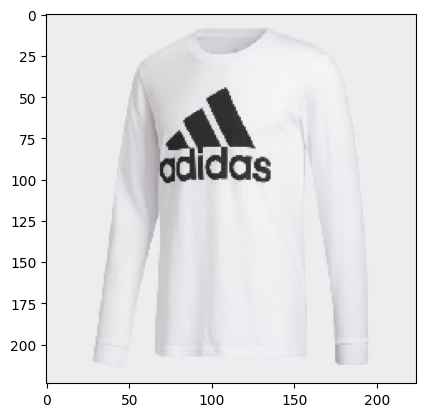

name:  datathon/badge_of_sport_tee
rating:  0.84228414


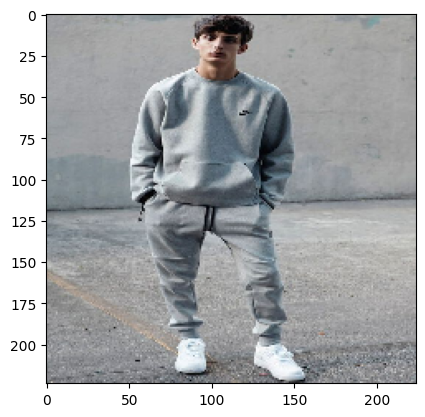

name:  datathon/test
rating:  0.841943


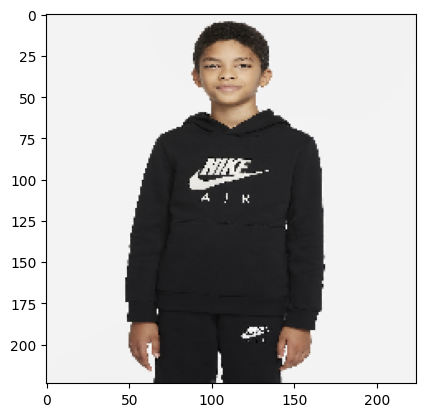

name:  datathon/nike_air
rating:  0.84191334


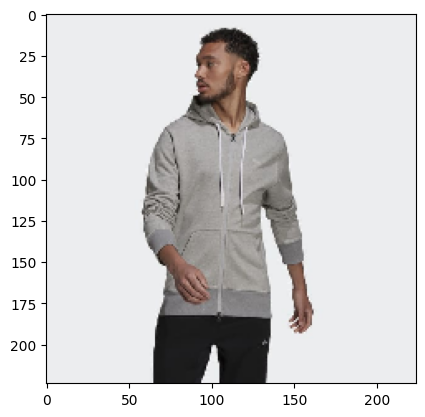

name:  datathon/adidas_sportswear_comfy_&_chill_full_zip_hoodie
rating:  0.8417055


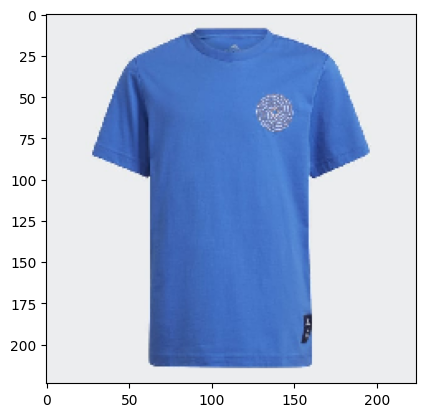

name:  datathon/real_madrid_tee
rating:  0.84088767


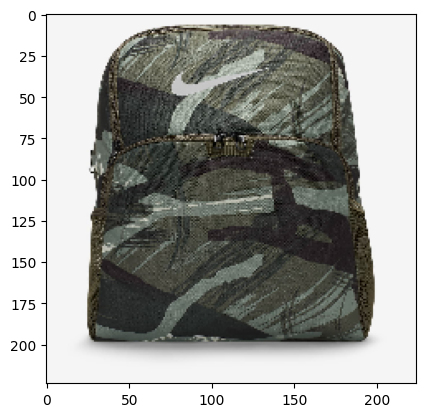

name:  datathon/nike_brasilia
rating:  0.84025985


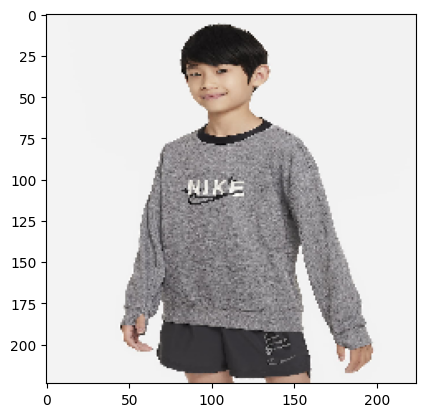

name:  datathon/nike_dri-fit_performance_select
rating:  0.83985


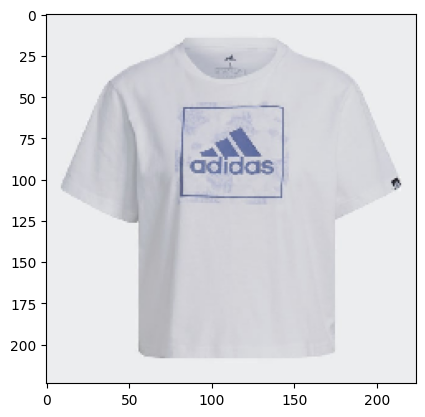

name:  datathon/flower_camo_box_graphic_tee
rating:  0.839811


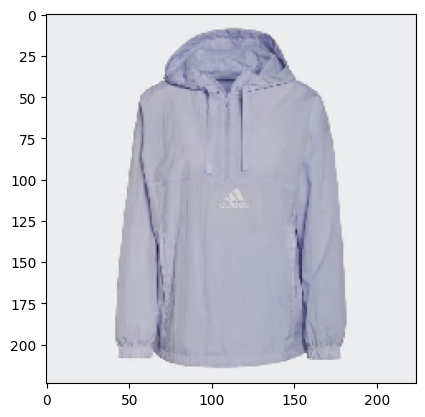

name:  datathon/brand_love_repeat_logo_half-zip_windbreaker
rating:  0.8389283


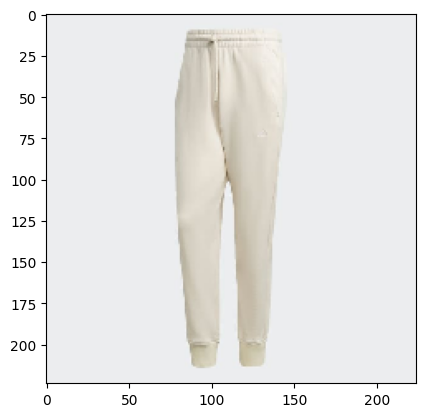

name:  datathon/adidas_sportswear_comfy_&_chill_pants
rating:  0.8385722


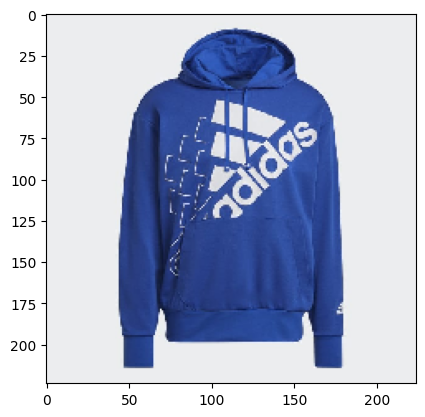

name:  datathon/essentials_logo_hoodie_(gender_neutral)
rating:  0.83821905


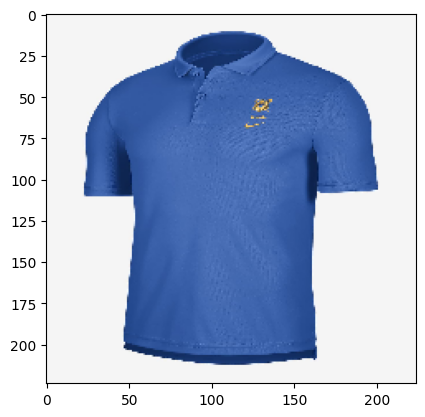

name:  datathon/nike_college_dri-fit_(ucla)
rating:  0.83757925


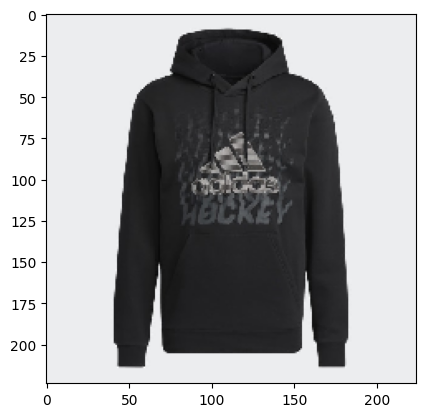

name:  datathon/adidas_hockey_hoodie
rating:  0.83741033


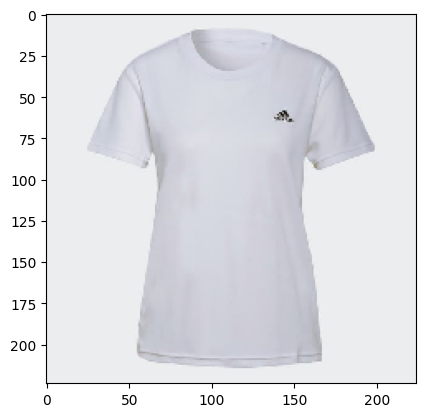

name:  datathon/aeroready_designed_2_move_sport_tee
rating:  0.8367266


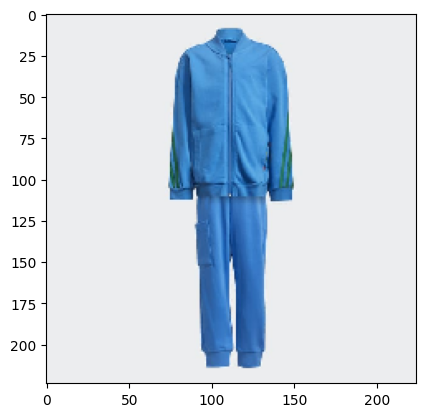

name:  datathon/adidas_x_classic_lego¨_track_suit
rating:  0.8365724


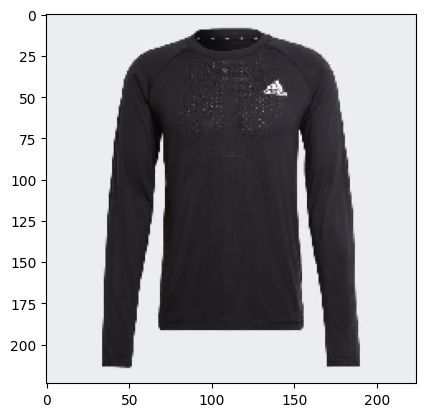

name:  datathon/aeroknit_designed_2_move_sport_seamless_long_sleeve_tee
rating:  0.8363113


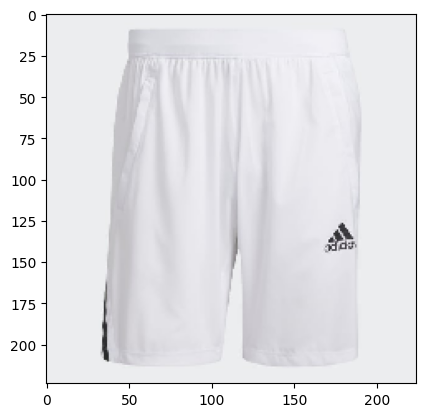

name:  datathon/aeroready_3-stripes_8-inch_shorts
rating:  0.835267


In [14]:
clf = linear_model.Ridge(alpha=0.01, fit_intercept  = True)
clf.fit(products_features, vector_cosine)
w = clf.coef_
b = clf.intercept_
ratings = products_features.dot(w) + b
top_indices = np.argsort(ratings)[::-1]

i = 0
showed_items = items
showed_items = [getID(item) for item in showed_items]
existed = len(showed_items)
while(len(showed_items) - existed != n_recommendations):
    name = getID(files[top_indices[i]])
    if name in showed_items:
        i+=1
        continue
    if os.path.exists(name + "_image_1.jpg"):
        filename = name + "_image_1.jpg"
    elif os.path.exists(name + "_image_1.png"):
        filename = name + "_image_1.png"
    else:
        filename = files[top_indices[i]]
    original = load_img(filename, target_size=(img_width, img_height))
    plt.imshow(original)
    plt.show()
    print("name: ", name)
    print("rating: ", ratings[top_indices[i]])
    i+=1
    showed_items.append(name)